Import plot and numerical dependencies

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.preprocessing import MinMaxScaler, StandardScaler, RobustScaler
import plotly.graph_objects as go
from plotly.graph_objs import Scatter

Let's start by defining a functions for generating a wave, and use it to plot a wave of period 10 with 520 samples and amplitude 1.

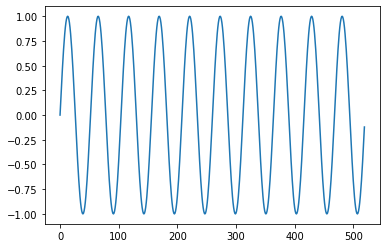

In [2]:
def wave(frequency, resolution, amplitude, fn=np.sin):
    length = np.pi * 2 * frequency
    my_wave = fn(np.arange(0, length, length / resolution))
    return my_wave * amplitude

series = wave(10, 520, 1)
plt.plot(series)
plt.show()

Define some plot functions. One uses matplotlib, while the other uses plotly. Plotly is better when you want to interact to better analize the graphic.

In [3]:
def plot(series: list, labels: list, show=True, ax = None, title = ''):
    if ax == None:
        plt.figure(figsize = (15, 6))
    for i, s in enumerate(series):
        module, title_fn = (plt, plt.title) if ax == None else (ax, ax.set_title)
        title_fn(title)
        module.plot(s, label=labels[i])
    if show:
        plt.legend(bbox_to_anchor =(1.25, 1))
        plt.show()
        
def plot_px(series: list, labels: list, title = ''):
    fig = go.Figure(layout_title_text=title)
    for i, data in enumerate(series):
        data = pd.Series(data)
        fig = fig.add_trace(Scatter(x = data.index, y = data, mode='lines', name=f'{labels[i]}'))
    fig.show()

Instatiate a scaler and fit it to the series. It is better to scale the series, as performs better with values between 0 and 1.

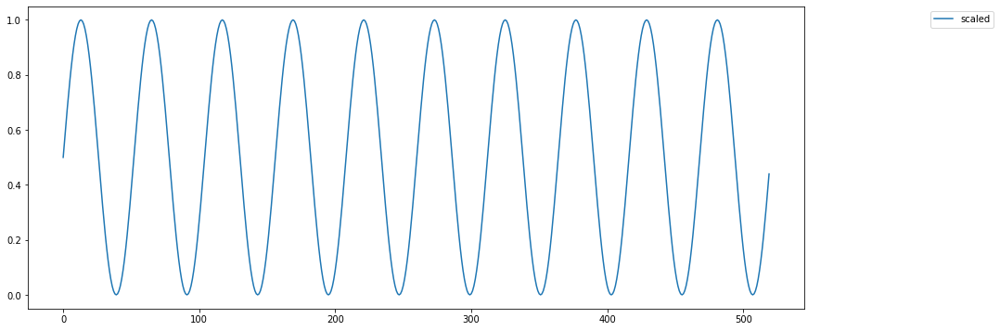

In [4]:
from sklearn.preprocessing import MinMaxScaler, StandardScaler, RobustScaler
scaler = MinMaxScaler()
scaled_series = scaler.fit_transform(series.reshape(-1, 1)).reshape(-1)
plot([scaled_series], ['scaled'])

We need to prepare the dataset to train the model. Let's start by trying to forecast the value of time `t` by feeding the value at time `t - 1`.

The previous values at time `t - n` are named *lags*. Here we are using 1 lag,

In [5]:
def prepare_lags(series: np.array, lags: int):
    range_right = lags + 1
    series_df = pd.Series(series)
    lagged_series = {f'y - {range_right - i}':series_df.shift(range_right - i) for i in range(1, range_right)}
    lagged_series_df = pd.DataFrame(lagged_series)
    lagged_series_df['y'] = series
    lagged_series_df = lagged_series_df.dropna()
    
    return lagged_series_df

lagged_series_df = prepare_lags(scaled_series, lags=1)
lagged_series_df.head(10)

,y - 1,y
1,0.500000,0.560268
2,0.560268,0.619658
3,0.619658,0.677302
4,0.677302,0.732362
5,0.732362,0.784032
6,0.784032,0.831561
7,0.831561,0.874255
8,0.874255,0.911492
9,0.911492,0.942728
10,0.942728,0.967508


Split our dataset into train and test sets. We use the 60% for train and 40% for test.

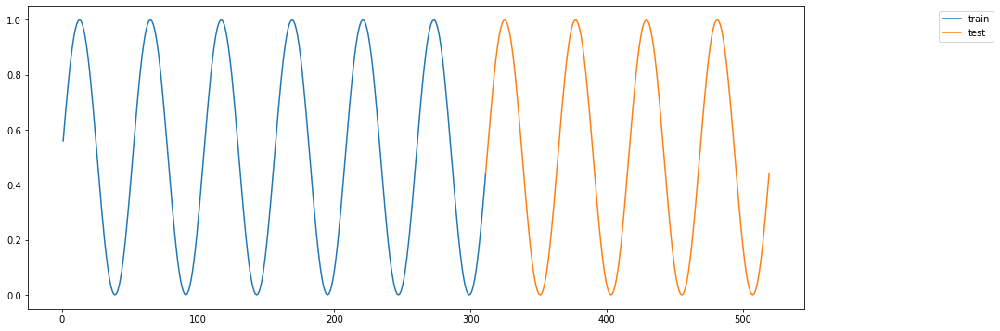

In [6]:
def split_test(series_df: pd.DataFrame, split_percentage: float):
    train_len = int(len(series_df) * split_percentage)
    train_df = series_df.loc[:train_len]
    test_df = series_df.loc[train_len:]
    
    return train_df.values[:, :-1], train_df.values[:, -1], test_df.values[:, :-1], test_df.values[:, -1], train_df, test_df

X_train, y_train, X_test, y_test, train_df, test_df = split_test(lagged_series_df, 0.6)
plot([train_df['y'], test_df['y']], labels=['train', 'test'])

Let's now import from tensorflow and keras, what we need for neural networks training.

In [7]:
import tensorflow as tf
tf.debugging.set_log_device_placement(False)
tf.config.set_visible_devices([], 'GPU')

from tensorflow import keras
from keras import layers, activations, optimizers
from keras.callbacks import EarlyStopping
from sklearn.metrics import mean_squared_error
import math

We are going to train the model using **Adam** gradient descent optimizer, and **mean squared error** as the function to measure the training error. We are going to train with a **batch size of 32** and a maximum of **200 epochs**. Epochs are **early stopped**, if no further improvement is observed for 30 consecutive epochs.

Once the model is trained, we will test it trying to predict the test values, one value at time. 

We will evaluate the quality of the model by measuring the **root mean squared error** between the actual test values and the predicted values.
We train the models 5 times each, in order to deal with the randomness of the training. Then we also take as second parameter of quality, the **standard deviation of the error**. This gives us a measure of the stability of the model.

As we scales values between 0 and 1 for training, we have to unscale before comparing them to the test values.

Let's define some helper functions in order to conduct the experiments.

In [8]:
def root_mean_squared_error(y, y_pred):
    return math.sqrt(mean_squared_error(y, y_pred))

def evaluate(y_test, forecast, show=True, ax=None):
    error = root_mean_squared_error(y_test, forecast)
    plot([y_test, forecast], ['actual', 'predicted'], show=show, ax=ax, title=f'error: {error}')
    
def unscale(series: np.array, scaler: MinMaxScaler):
    return scaler.inverse_transform(series.reshape(-1, 1)).reshape(-1)
    
def run_model(
    model_layers: list, 
    X_train: np.array, 
    y_train: np.array, 
    X_test: np.array, 
    y_test: np.array, 
    epochs:int,
    batch_size=32, 
    name='',
    early_stop=True,
    learning_rate=0.001,
    verbose=True
    ):
    
    early_stop_cb = EarlyStopping(
        monitor = 'val_loss', min_delta = 0.0001,
        patience = 30, mode = 'min', verbose = verbose,
        restore_best_weights = True)
    
    model = keras.models.clone_model(keras.Sequential(model_layers, name=name))
    model.compile(optimizer=optimizers.Adam(learning_rate = learning_rate), loss='mean_squared_error')

    history = model.fit(
        X_train, 
        y_train,
        epochs=epochs,
        batch_size=batch_size,
        validation_data=(X_test, y_test),
        verbose=False,
        callbacks=[early_stop_cb] if early_stop else []
        )

    forecast = model.predict(X_test, verbose=verbose)    
    return forecast, history, model

def evaluate_model(
    run_times: int,
    model_layers: list, 
    X_train: np.array, 
    y_train: np.array, 
    X_test: np.array, 
    y_test: np.array, 
    epochs:int,
    scaler: MinMaxScaler,
    batch_size=32,
    name='',
    early_stop=True, 
    learning_rate=0.001,
    verbose=True,
    print_plot=True,
    print_summary=True
    ):
    
    errors = []
    forecasts = []
    models = []
    histories = []
    y_test_unscaled = unscale(y_test, scaler)
    
    for _ in range(run_times):
        forecast, history, model = run_model(
            model_layers, 
            X_train, y_train, X_test, y_test,
            epochs=epochs, 
            batch_size=batch_size,
            name=name,
            early_stop=early_stop,
            learning_rate=learning_rate,
            verbose=verbose
        )

        forecast = unscale(forecast, scaler)
        error = root_mean_squared_error(y_test_unscaled, forecast)
        errors.append(error)
        forecasts.append(forecast)
        models.append(model)
        histories.append(history)
        
    error_avg = np.array(errors).mean()
    error_std = np.array(errors).std()
    if print_summary:        
        models[0].summary()
        print(f'errors: {errors}')
        print(f'error avg: {error_avg}')    
        print(f'error std: {error_std}')
    
    if print_plot:
        _, ax = plt.subplots(1, len(histories), figsize=(25,6))
        for i, history in enumerate(histories):
            plot([history.history['loss'], history.history['val_loss']], labels=['loss', 'val_loss'], ax=ax[i], show=False)
        plt.legend(bbox_to_anchor =(1.25, 1))
        plt.show()
            
        plot([y_test_unscaled] + forecasts, ['actual'] + [f'prediction_{i}' for i in range(len(forecast))])
        plot_px([y_test_unscaled] + forecasts, ['actual'] + [f'prediction_{i}' for i in range(len(forecast))])
    
    return { name: (errors, error_avg, error_std) }

def baseline(test_series):
    _, ax = plt.subplots(1, 2, figsize=(25,6))
    evaluate(test_series, [test_series.mean()] * len(test_series), show=False, ax=ax[0])
    evaluate(test_series[1:], pd.DataFrame(test_series).shift(1).dropna(), show=False, ax=ax[1])
    plt.legend(bbox_to_anchor =(1.25, 1))
    plt.show()

Before starting with the experiments, let's define two **naives baseline models**, to compare: 
 1. the average value of the test set
 2. the same series shifted by 1 time period (i.e. the forecasted value of time `t` is the series value at time `t-1`)

Our NN models will have to perform better then these two.

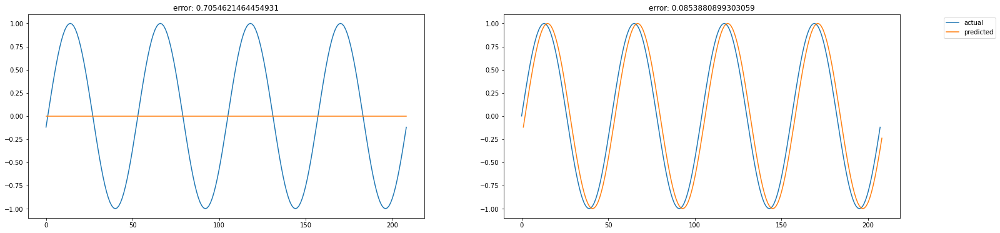

In [9]:
y_test_unscaled = unscale(y_test, scaler)
baseline(y_test_unscaled)

We will start from evaluating how a simple Multi layer perceptron is good in fitting this function, feeding it with one lag.
We define only one hidden layer with 5 neurons.

Model: "Simple_MLP_1_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 5)                 10        
                                                                 
 dense_1 (Dense)             (None, 1)                 6         
                                                                 
Total params: 16
Trainable params: 16
Non-trainable params: 0
_________________________________________________________________
errors: [0.08782273477670433, 0.08939729670502711, 0.08683501947928755, 0.0862102830059519, 0.08652147344093034]
error avg: 0.08735736148158024
error std: 0.001154577587932865


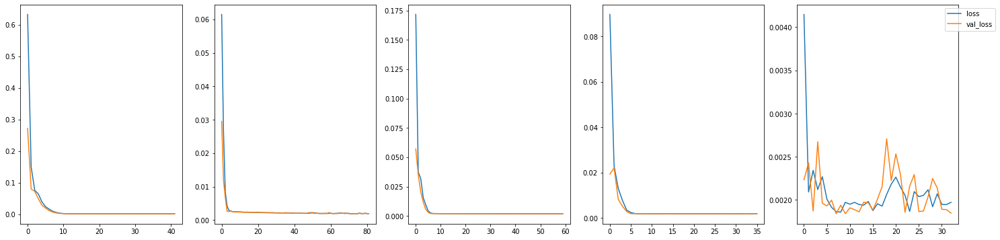

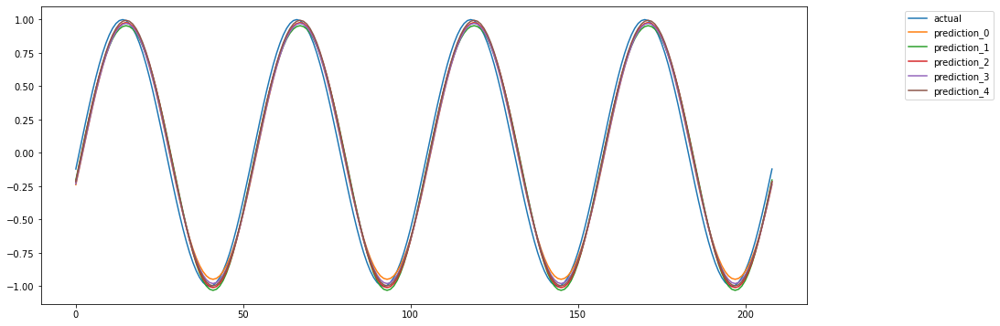

In [10]:

lags = 1
lagged_series_df = prepare_lags(scaled_series, lags=lags)
X_train, y_train, X_test, y_test, train_df, test_df = split_test(lagged_series_df, 0.6)

lags1_results = evaluate_model(
    5,
    [
        layers.Dense(5, activation=activations.elu),
        layers.Dense(1, activation=activations.linear)
    ], 
    X_train, y_train, X_test, y_test,
    epochs=100,
    batch_size=32,
    name=f'Simple_MLP_{lags}_lags',
    scaler=scaler,
    early_stop=True,
    learning_rate=0.01,
    verbose=False,
    print_summary=True
)

The result is not that good. The result looks similar to the shifted baseline model.

Let's try to emprove it by adding one more lag to the input.

In [11]:
lags=2
lagged_series_df = prepare_lags(scaled_series, lags=lags)
lagged_series_df.head(10)

,y - 2,y - 1,y
2,0.500000,0.560268,0.619658
3,0.560268,0.619658,0.677302
4,0.619658,0.677302,0.732362
5,0.677302,0.732362,0.784032
6,0.732362,0.784032,0.831561
7,0.784032,0.831561,0.874255
8,0.831561,0.874255,0.911492
9,0.874255,0.911492,0.942728
10,0.911492,0.942728,0.967508
11,0.942728,0.967508,0.985471


Model: "Simple_MLP_2_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2 (Dense)             (None, 5)                 15        
                                                                 
 dense_3 (Dense)             (None, 1)                 6         
                                                                 
Total params: 21
Trainable params: 21
Non-trainable params: 0
_________________________________________________________________
errors: [0.011517546725514314, 0.019678143776390055, 0.01843735822086249, 0.008022118417653145, 0.02671325300477518]
error avg: 0.01687368402903904
error std: 0.006544701821593318


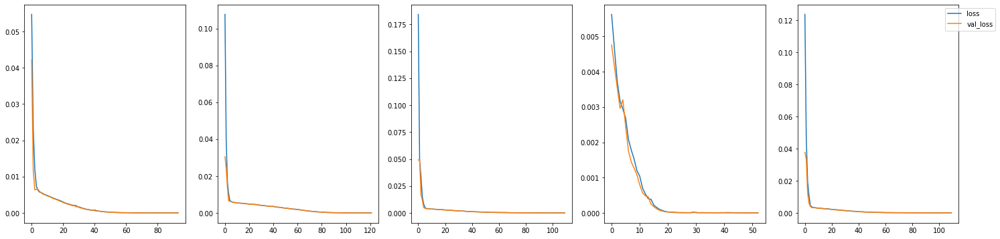

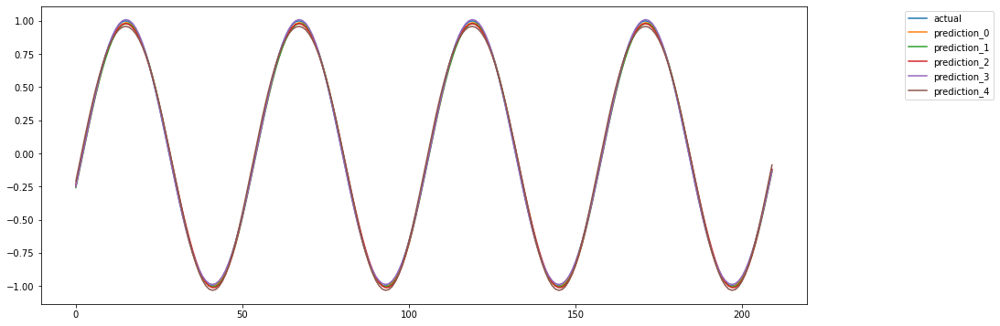

In [12]:
lags = 2
lagged_series_df = prepare_lags(scaled_series, lags=lags)
X_train, y_train, X_test, y_test, train_df, test_df = split_test(lagged_series_df, 0.6)

lags2_results = evaluate_model(
    5,
    [
        layers.Dense(5, activation=activations.elu),
        layers.Dense(1, activation=activations.linear)
    ], 
    X_train, y_train, X_test, y_test,
    epochs=200,
    batch_size=32,
    name=f'Simple_MLP_{lags}_lags',
    scaler=scaler,
    early_stop=True,
    learning_rate=0.01,    
    verbose=False,
    print_summary=True
)

Now the model is able to learn the function with a very low error.

We have evidence that feeding more lags is the right path. 

But what if we add some **noise** to the sinusoid?

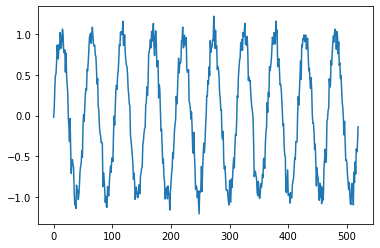

In [13]:
def noise(resolution, std, amplitude = 1):
    return np.random.normal(0, std, resolution) * amplitude

resolution = 520
noisy_sin_series = wave(10, resolution, 1) + noise(resolution, 0.1)
plt.plot(noisy_sin_series)
plt.show()

We added a pure random noise with a 0.1 std value. We **can't expect our model having an error value lower than 0.1**, but it must be as close as possible.

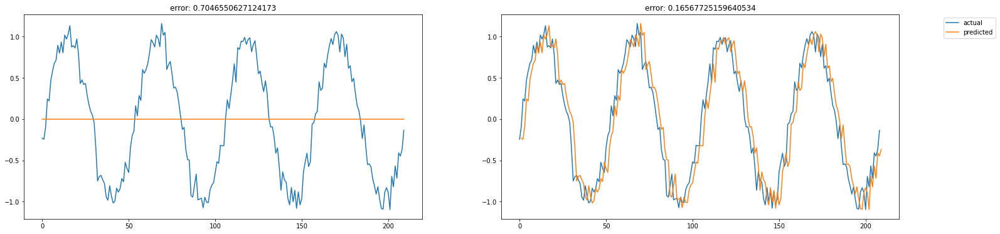

In [14]:
lags = 2
scaled_series = scaler.fit_transform(noisy_sin_series.reshape(-1, 1)).reshape(-1)
lagged_series_df = prepare_lags(scaled_series, lags=lags)
X_train, y_train, X_test, y_test, train_df, test_df = split_test(lagged_series_df, 0.6)

y_test_unscaled = unscale(y_test, scaler)
baseline(y_test_unscaled)

Model: "Simple_MLP_2_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_4 (Dense)             (None, 5)                 15        
                                                                 
 dense_5 (Dense)             (None, 1)                 6         
                                                                 
Total params: 21
Trainable params: 21
Non-trainable params: 0
_________________________________________________________________
errors: [0.16819883205036887, 0.16575178567153892, 0.16522440827511428, 0.16621711726614855, 0.16579729010447813]
error avg: 0.16623788667352976
error std: 0.0010298831122104103


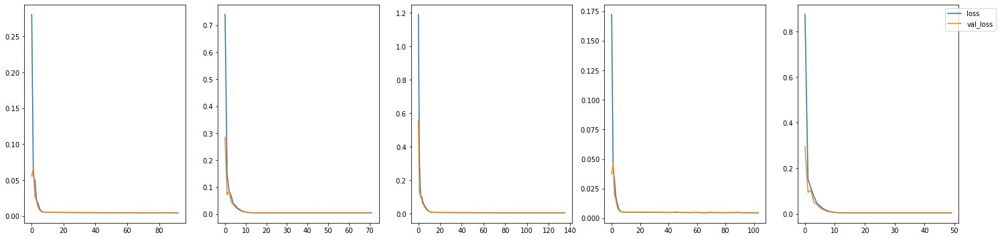

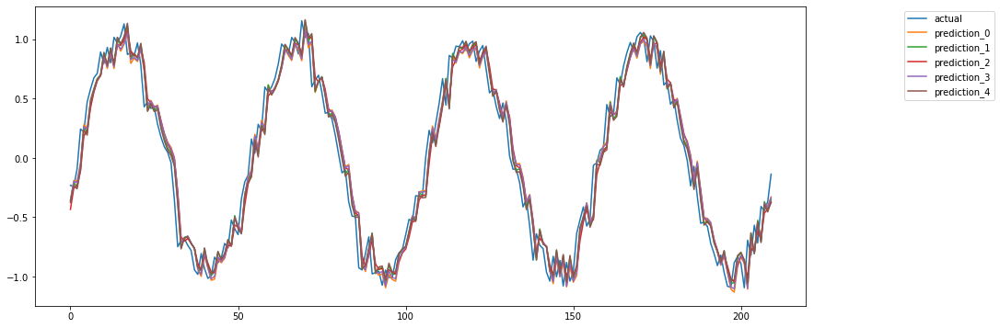

In [15]:
lags2_results = evaluate_model(
    5,
    [
        layers.Dense(5, activation=activations.elu),
        layers.Dense(1, activation=activations.linear)
    ], 
    X_train, y_train, X_test, y_test,
    epochs=200,
    batch_size=32,
    name=f'Simple_MLP_{lags}_lags',
    scaler=scaler,
    early_stop=True,
    learning_rate=0.01,
    verbose=False,
    print_summary=True
)

The model is stable but does not perform any better than the baseline model. Adding noise, reintroduced the shifting problem. That means that the model in not anymore able to discover the underlying sinusoidal pattern.
Let's try to add more lags.

Model: "Simple_MLP_4_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_6 (Dense)             (None, 5)                 25        
                                                                 
 dense_7 (Dense)             (None, 1)                 6         
                                                                 
Total params: 31
Trainable params: 31
Non-trainable params: 0
_________________________________________________________________
errors: [0.15914820505115293, 0.15698906705608554, 0.15758690267969427, 0.15725286365863486, 0.15679034382071658]
error avg: 0.15755347645325685
error std: 0.0008409011890008267


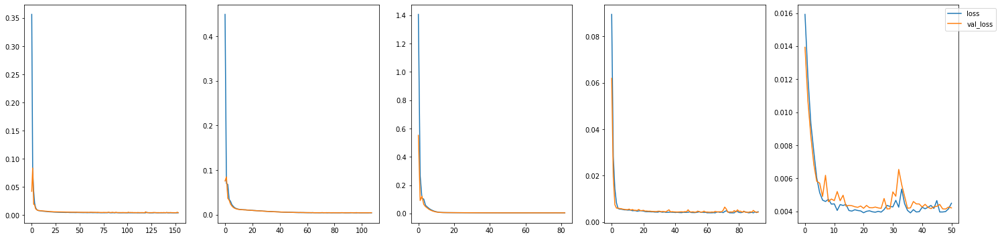

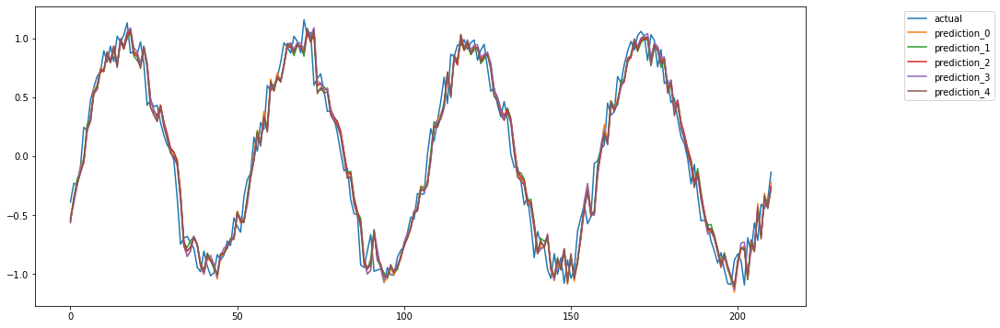

In [16]:
lags=4
lagged_series_df = prepare_lags(scaled_series, lags=lags)
X_train, y_train, X_test, y_test, train_df, test_df = split_test(lagged_series_df, 0.6)

lags4_results = evaluate_model(
    5,
    [
        layers.Dense(5, activation=activations.elu),
        layers.Dense(1, activation=activations.linear)
    ], 
    X_train, y_train, X_test, y_test,
    epochs=200,
    batch_size=32,
    name=f'Simple_MLP_{lags}_lags',
    scaler=scaler,
    early_stop=True,
    learning_rate=0.01,
    verbose=False,
    print_summary=True
)

Now the model is performs better than the baselines, but the average is not that good. Let's see if we are able to improve it by adding more hidden layers.

Model: "MLP_4_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_8 (Dense)             (None, 10)                50        
                                                                 
 dense_9 (Dense)             (None, 100)               1100      
                                                                 
 dense_10 (Dense)            (None, 10)                1010      
                                                                 
 dense_11 (Dense)            (None, 1)                 11        
                                                                 
Total params: 2,171
Trainable params: 2,171
Non-trainable params: 0
_________________________________________________________________
errors: [0.15428893747344136, 0.15424229448346227, 0.15537088604015845, 0.1569070505531962, 0.1538819348647639]
error avg: 0.15493822068300442
error std: 0.0011031873875535704


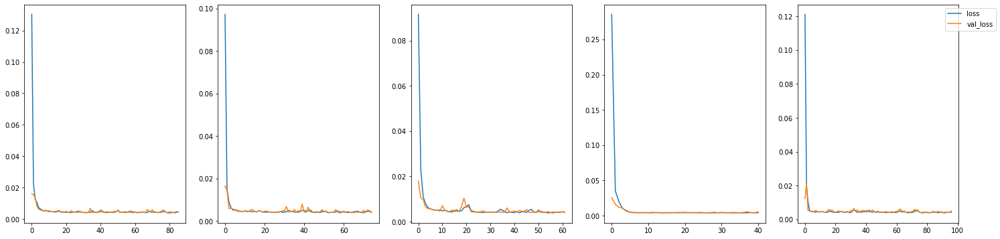

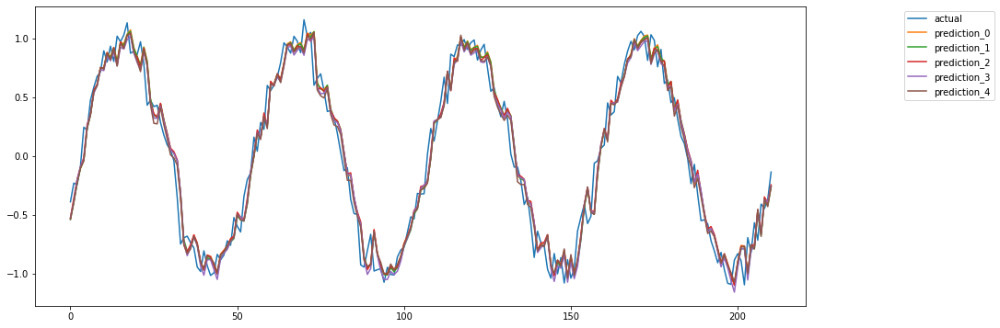

In [17]:
lags4_results_noise_MLP = evaluate_model(
    5,
    [
        layers.Dense(10, activation=activations.elu),
        layers.Dense(100, activation=activations.elu),
        layers.Dense(10, activation=activations.elu),
        layers.Dense(1, activation=activations.linear)
    ], 
    X_train, y_train, X_test, y_test,
    epochs=200,
    batch_size=32,
    name=f'MLP_{lags}_lags',
    scaler=scaler,
    early_stop=True,
    learning_rate=0.01,
    verbose=False,
    print_summary=True
)

We can observe a little improvement but nothing actually satisfying.

What if we introduce more sophisticated models like **Recurrent Neural Networks** and **Convolutional Neural Networks**?

In [18]:
def evaluate_all_models(X_train, y_train, X_test, y_test, scaler, verbose=False, plot=True, print_summary=True, first_hidden_num=10):
    lags = X_train.shape[1]
    result = {}

    result.update(evaluate_model(
        5,
        [
            layers.Dense(first_hidden_num, activation=activations.elu),
            layers.Dense(1, activation=activations.linear)
        ], 
        X_train, y_train, X_test, y_test,
        epochs=200,
        batch_size=32,
        name=f'Simple_MLP_{lags}_lags',
        scaler=scaler,
        early_stop=True,
        learning_rate=0.01,
        verbose=verbose,
        print_plot=plot,
        print_summary=print_summary
    ))

    result.update(evaluate_model(
        5,
        [
            layers.Dense(first_hidden_num, activation=activations.elu),
            layers.Dense(100, activation=activations.elu),
            layers.Dense(10, activation=activations.elu),
            layers.Dense(1, activation=activations.linear)
        ], 
        X_train, y_train, X_test, y_test,
        epochs=200,
        batch_size=32,
        name=f'Deep_MLP_{lags}_lags',
        scaler=scaler,
        early_stop=True,
        learning_rate=0.01,
        verbose=verbose,
        print_plot=plot,
        print_summary=print_summary
    ))

    result.update(evaluate_model(
        5,
        [
            layers.Dense(first_hidden_num, activation=activations.elu),
            layers.Dense(100, activation=activations.elu),
            layers.Dropout(0.1),
            layers.Dense(10, activation=activations.elu),
            layers.Dense(1, activation=activations.linear)
        ], 
        X_train, y_train, X_test, y_test,
        epochs=200,
        batch_size=32,
        name=f'Deep_MLP_Dropout_{lags}_lags',
        scaler=scaler,
        early_stop=True,
        learning_rate=0.01,
        verbose=verbose,
        print_plot=plot,
        print_summary=print_summary
    ))

    result.update(evaluate_model(
        5,
        [
            layers.SimpleRNN(first_hidden_num, activation=activations.elu),
            layers.Dense(5, activation=activations.elu),
            layers.Dense(1, activation=activations.linear)
        ], 
        X_train.reshape(X_train.shape[0], X_train.shape[1], 1),
        y_train, 
        X_test.reshape(X_test.shape[0], X_test.shape[1], 1), 
        y_test,
        epochs=200,
        batch_size=32,
        name=f'RNN_{lags}_lags',
        scaler=scaler,
        early_stop=True,
        learning_rate=0.01,
        verbose=verbose,
        print_plot=plot,
        print_summary=print_summary
    ))

    result.update(evaluate_model(
        5,
        [
            layers.SimpleRNN(20, activation=activations.elu, return_sequences=True),
            layers.SimpleRNN(10, activation=activations.elu),
            layers.Dense(5, activation=activations.elu),
            layers.Dense(1, activation=activations.linear)
        ], 
        X_train.reshape(X_train.shape[0], X_train.shape[1], 1), 
        y_train, 
        X_test.reshape(X_test.shape[0], X_test.shape[1], 1), 
        y_test,
        epochs=200,
        batch_size=32,
        name=f'RNN_RNN_{lags}_lags',
        scaler=scaler,
        early_stop=True,
        learning_rate=0.01,
        verbose=verbose,
        print_plot=plot,
        print_summary=print_summary
    ))

    result.update(evaluate_model(
        5,
        [
            layers.LSTM(first_hidden_num, activation=activations.elu),
            layers.Dense(5, activation=activations.elu),
            layers.Dense(1, activation=activations.linear)
        ], 
        X_train.reshape(X_train.shape[0], X_train.shape[1], 1), 
        y_train, 
        X_test.reshape(X_test.shape[0], X_test.shape[1], 1), 
        y_test,
        epochs=200,
        batch_size=32,
        name=f'LSTM_{lags}_lags',
        scaler=scaler,
        early_stop=True,
        learning_rate=0.01,
        verbose=verbose,
        print_plot=plot,
        print_summary=print_summary
    ))

    result.update(evaluate_model(
        5,
        [
            layers.GRU(first_hidden_num, activation=activations.elu),
            layers.Dense(5, activation=activations.elu),
            layers.Dense(1, activation=activations.linear)
        ], 
        X_train.reshape(X_train.shape[0], X_train.shape[1], 1), 
        y_train, 
        X_test.reshape(X_test.shape[0], X_test.shape[1], 1), 
        y_test,
        epochs=200,
        batch_size=32,
        name=f'GRU_{lags}_lags',
        scaler=scaler,
        early_stop=True,
        learning_rate=0.01,
        verbose=verbose,
        print_plot=plot,
        print_summary=print_summary
    ))

    result.update(evaluate_model(
        5,
        [
            layers.Conv1D(64, kernel_size=math.ceil(lags / 2.), activation=activations.elu),
            layers.Flatten(),
            layers.Dropout(0.1),
            layers.Dense(5, activation=activations.elu),
            layers.Dense(1, activation=activations.linear)
        ], 
        X_train.reshape(X_train.shape[0], X_train.shape[1], 1), 
        y_train, 
        X_test.reshape(X_test.shape[0], X_test.shape[1], 1), 
        y_test,
        epochs=200,
        batch_size=32,
        name=f'CNN_Dropout_{lags}_lags',
        scaler=scaler,
        early_stop=True,
        learning_rate=0.01,
        verbose=verbose,
        print_plot=plot,
        print_summary=print_summary
    ))

    result.update(evaluate_model(
        5,
        [
            layers.Conv1D(64, kernel_size=math.ceil(lags / 2.), activation=activations.elu),
            layers.Flatten(),
            layers.Dense(5, activation=activations.elu),
            layers.Dense(1, activation=activations.linear)
        ], 
        X_train.reshape(X_train.shape[0], X_train.shape[1], 1), 
        y_train, 
        X_test.reshape(X_test.shape[0], X_test.shape[1], 1), 
        y_test,
        epochs=200,
        batch_size=32,
        name=f'CNN_{lags}_lags',
        scaler=scaler,
        early_stop=True,
        learning_rate=0.01,
        verbose=verbose,
        print_plot=plot,
        print_summary=print_summary
    ))
    
    result2 = np.array([[k, v[1], v[2]] for k,v in zip(result.keys(), result.values())])
    return pd.DataFrame({'avg': result2[:, 1], 'std': result2[:, 2]}, index = result2[:, 0])

In [19]:
result_4_lags_all_models = evaluate_all_models(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test, scaler=scaler, verbose=False, plot=False, print_summary=False)
result_4_lags_all_models

,avg,std
Simple_MLP_4_lags,0.15722588016942013,0.000941157975242114
Deep_MLP_4_lags,0.15407510851987438,0.0010446762481409347
Deep_MLP_Dropout_4_lags,0.1549674034563719,0.0003754655029149716
RNN_4_lags,0.15581100359645403,0.001009605652882577
RNN_RNN_4_lags,0.15416029186745023,0.0015869984444679313
LSTM_4_lags,0.15592267049551753,0.001303846281705202
GRU_4_lags,0.15703547013245883,0.0006220975937253277
CNN_Dropout_4_lags,0.1566442733033256,0.0009966218830980333
CNN_4_lags,0.15688952179276655,0.001065231031214297


We can observe that neither the RNN models nor the CNN models actually improve the prediction. The deep MLP is still the best performer. We can observe that CNN is more stable with a Droupout level after .

In [20]:
result_4_lags_all_models_20hidden = evaluate_all_models(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test, scaler=scaler, verbose=False, plot=False, print_summary=False, first_hidden_num=20)
result_4_lags_all_models_20hidden

,avg,std
Simple_MLP_4_lags,0.15678783798344892,0.0009702383594470439
Deep_MLP_4_lags,0.15427692084876474,0.0005808360191945642
Deep_MLP_Dropout_4_lags,0.1541158803835564,0.0011014203898164904
RNN_4_lags,0.1564773291679043,0.0010359878256102982
RNN_RNN_4_lags,0.15234794231447024,0.0010578978961982449
LSTM_4_lags,0.1568012790535125,0.0004218755192673262
GRU_4_lags,0.15716114454457347,0.0014464364948421132
CNN_Dropout_4_lags,0.15699705074885187,0.00030919198623178374
CNN_4_lags,0.15641048733149843,0.0007159005045820495


We don't observe any significant improvement by highering the number of the hidden layers. But what happens if we higher again the number of lags?

In [21]:
def fft(series):
    n = len(series)
    fft = np.fft.fft(series, n)
    PSD = fft * np.conj(fft) / n
    
    return PSD.real

def new_series(series, scaler, lags=10):
    _, ax = plt.subplots(1, 2, figsize=(25,6))
    ax[0].plot(series)
    ax[0].set_title('series')
    ax[1].plot(fft(series))
    ax[1].set_title('fourier components')
    plt.show()

    scaled_series = scaler.fit_transform(series.reshape(-1, 1)).reshape(-1)
    lagged_series_df = prepare_lags(scaled_series, lags=lags)
    X_train, y_train, X_test, y_test, train_df, test_df = split_test(lagged_series_df, 0.6)

    y_test_unscaled = unscale(y_test, scaler)
    
    _, ax = plt.subplots(1, 2, figsize=(25,6))
    evaluate(y_test_unscaled, [y_test_unscaled.mean()] * len(y_test_unscaled), show=False, ax=ax[0])
    evaluate(y_test_unscaled[1:], pd.DataFrame(y_test_unscaled).shift(1).dropna(), show=False, ax=ax[1])
    plt.legend(bbox_to_anchor =(1.25, 1))
    plt.show()
    
    return series, X_train, y_train, X_test, y_test, lagged_series_df

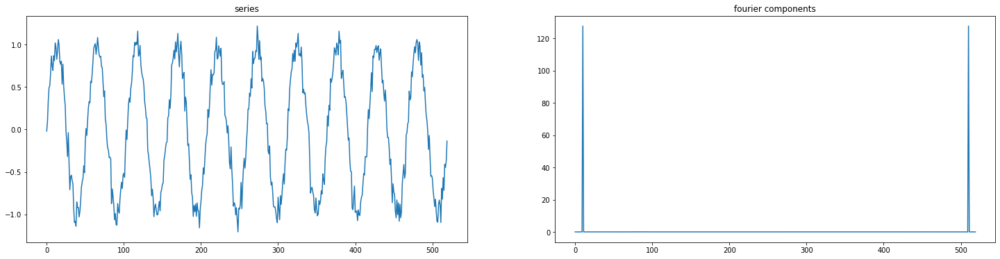

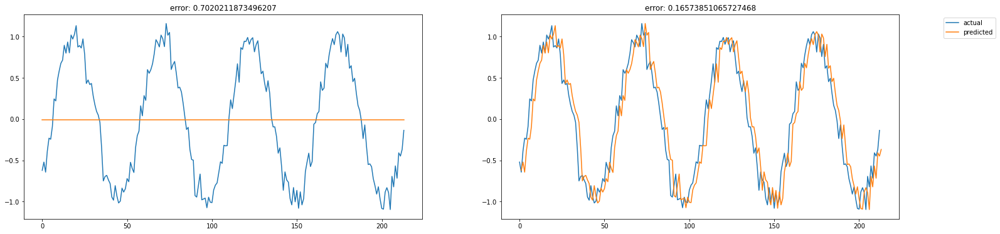

,avg,std
Simple_MLP_10_lags,0.12240292182737475,0.0012521456138614164
Deep_MLP_10_lags,0.12090110534110676,0.0005886478915926881
Deep_MLP_Dropout_10_lags,0.12209473705248239,0.0020113834913206966
RNN_10_lags,0.12232521576872162,0.0037012348007245542
RNN_RNN_10_lags,0.12113934915907054,0.0010581094774630745
LSTM_10_lags,0.12354238144214089,0.00041154961592976415
GRU_10_lags,0.1241309393400051,0.0014918939470236006
CNN_Dropout_10_lags,0.12124208050941879,0.0031216585942993114
CNN_10_lags,0.12097375179580402,0.002362403570162408


In [22]:
lags=10
noisy_sin_series, X_train, y_train, X_test, y_test, lagged_series_df = new_series(noisy_sin_series, scaler, lags)
result_10_lags_all_models = evaluate_all_models(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test, scaler=scaler, verbose=False, plot=False, print_summary=False)
result_10_lags_all_models

Now we observe a significant improvement in all of the models. In case of a CNNs go very close to the target value of 0.1. With 10 lags, all the networks are very good in discovering the underlying pattern.

Let's try to higher the lags one more time to 20. Together we also higher to 20 the number of hidden layers.

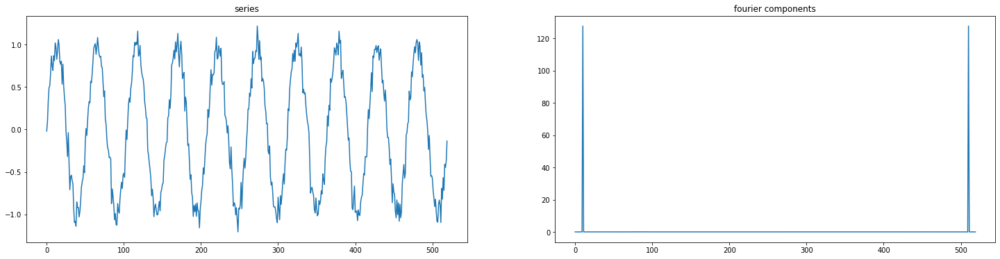

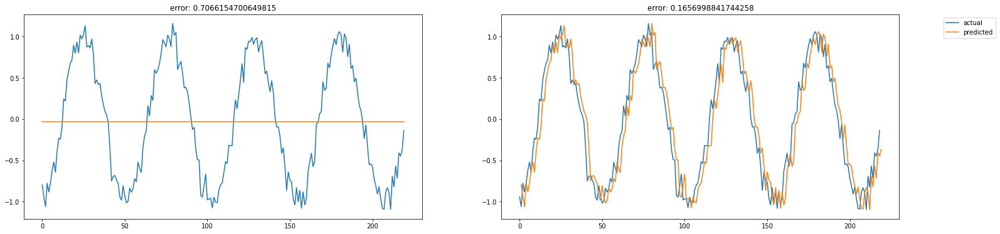

,avg,std
Simple_MLP_20_lags,0.11251780147724073,0.0005689915046196219
Deep_MLP_20_lags,0.11385834514397575,0.0015114522782785486
Deep_MLP_Dropout_20_lags,0.11259543980251294,0.0014923498327438923
RNN_20_lags,0.11512954528209678,0.0019635971285469297
RNN_RNN_20_lags,0.11584813941637113,0.002369708090966007
LSTM_20_lags,0.11407325700432355,0.0006858598769041075
GRU_20_lags,0.1121812805983781,0.001588747863047463
CNN_Dropout_20_lags,0.11115862901655957,0.0018146178298043838
CNN_20_lags,0.11030015870010071,0.0015238428816985103


In [23]:
lags=20
noisy_sin_series, X_train, y_train, X_test, y_test, lagged_series_df = new_series(noisy_sin_series, scaler, lags)
result_20_lags_all_models = evaluate_all_models(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test, scaler=scaler, verbose=False, plot=False, print_summary=False, first_hidden_num=20)
result_20_lags_all_models

Even better for all the models.

What if the signal changes in time? Let's observe the models behavior on a fading wave

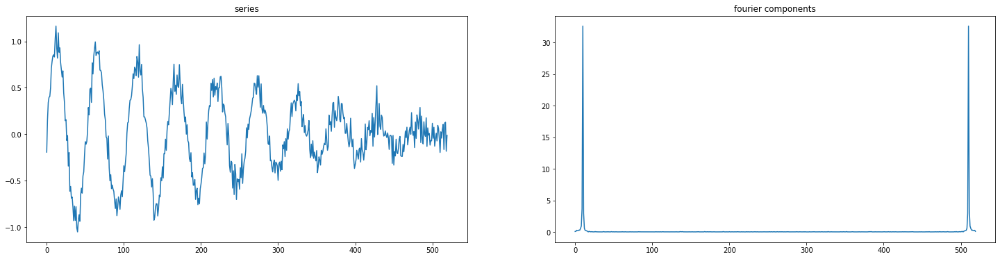

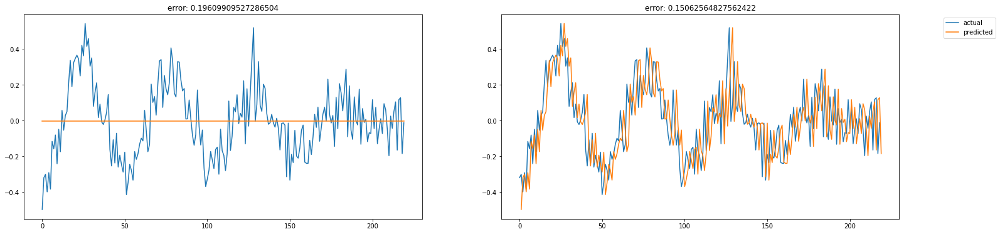

In [24]:
def fading_wave(frequency, resolution, amplitude, fn=np.sin, reverse=True):
    my_wave = wave(frequency, resolution, amplitude, fn)
    fading_amplitude = np.linspace(0, 1, resolution)
    if(reverse):
        fading_amplitude = np.flip(fading_amplitude)
    return my_wave * fading_amplitude

lags=20
resolution = 520
fading_series_noise1, X_train, y_train, X_test, y_test, lagged_series_df = new_series(
    fading_wave(10, resolution, 1) + noise(resolution, 0.1),
    scaler, 
    lags=lags)

In [25]:
fading_result_20_lags_all_models = evaluate_all_models(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test, scaler=scaler, verbose=False, plot=False, print_summary=False, first_hidden_num=20)
fading_result_20_lags_all_models

,avg,std
Simple_MLP_20_lags,0.11206894761248927,0.001390600852218335
Deep_MLP_20_lags,0.11318314680419148,0.0020200247280323367
Deep_MLP_Dropout_20_lags,0.11359786532994984,0.0029089625008610277
RNN_20_lags,0.1187548052617116,0.003493873023776813
RNN_RNN_20_lags,0.11669391941706923,0.0021981909927314223
LSTM_20_lags,0.11607562134313207,0.0011421977503894218
GRU_20_lags,0.11466721357795025,0.0011660619715804026
CNN_Dropout_20_lags,0.11050856318249122,0.0019467129520537166
CNN_20_lags,0.11206384560111596,0.0015227084446137228


CNN are the best performers in this case.

We observed the models performing on simple sinusoidal functions with some noise. Does anything changes when the series gets more complex?
Let's add some other waves and a trend.

In [26]:
def trend(length, c1 = 1.0, c2 = 0.0, amplitude = 1.0):
    xs = np.linspace(0, 1, length)
    ys = 1.0 / (1 + np.exp(-c1 * (xs - c2)))
    return ys * amplitude

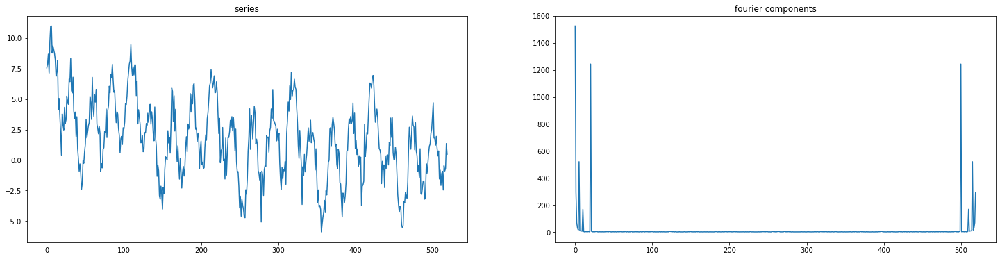

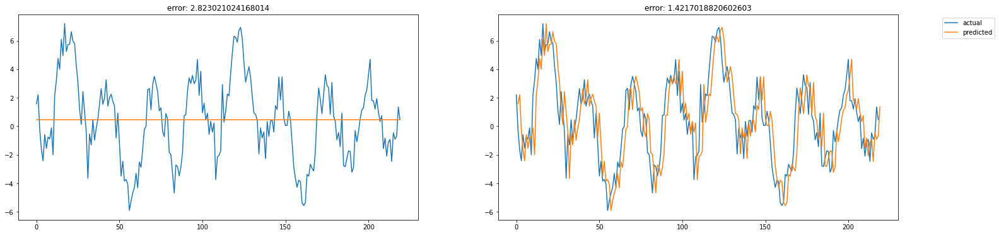

In [27]:
resolution = 520
complex_series_noise1, X_train, y_train, X_test, y_test, lagged_series_df = new_series(
    trend(resolution, -4, 0, 10) +
    wave(10, resolution, 1) + 
    wave(20, resolution, 3) + 
    wave(5, resolution, 2, np.cos) + 
    noise(resolution, 1),
    scaler, 
    lags=lags)

In [28]:
complex_result_20_lags_all_models = evaluate_all_models(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test, scaler=scaler, verbose=False, plot=False, print_summary=False, first_hidden_num=20)
complex_result_20_lags_all_models

,avg,std
Simple_MLP_20_lags,1.2200197739631602,0.01593507840074611
Deep_MLP_20_lags,1.2273845663670884,0.023780355572976385
Deep_MLP_Dropout_20_lags,1.241525905437513,0.010542469314846115
RNN_20_lags,1.2497474110874789,0.010844086208635067
RNN_RNN_20_lags,1.2630380142552116,0.047907921789535936
LSTM_20_lags,1.1904608025987717,0.004024305801834239
GRU_20_lags,1.1843987049784128,0.005457075003563841
CNN_Dropout_20_lags,1.2558973459831528,0.014578082775831305
CNN_20_lags,1.2452026158141554,0.014769970463373234


Looks like LSTM emerges here as one of the best models.

Let's now experiment, highering the noise level.

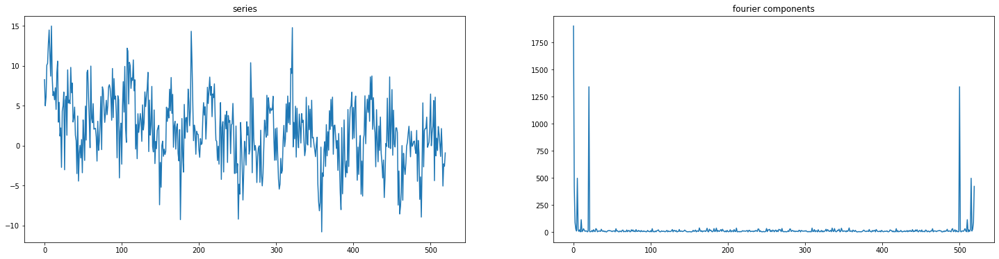

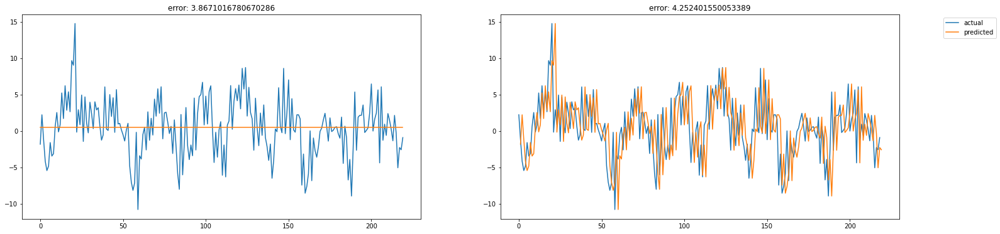

In [29]:
complex_series_noise3, X_train, y_train, X_test, y_test, lagged_series_df = new_series(
    trend(resolution, -4, 0, 10) +
    wave(10, resolution, 1) + 
    wave(20, resolution, 3) + 
    wave(5, resolution, 2, np.cos) + 
    noise(resolution, 3),
    scaler, 
    lags=lags)

In [30]:
complex_noise3_result_20_lags_all_models = evaluate_all_models(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test, scaler=scaler, verbose=False, plot=False, print_summary=False, first_hidden_num=20)
complex_noise3_result_20_lags_all_models

,avg,std
Simple_MLP_20_lags,3.219987464933625,0.018503467708945693
Deep_MLP_20_lags,3.216004820687972,0.025161028071264857
Deep_MLP_Dropout_20_lags,3.2154297306769495,0.02820842365091077
RNN_20_lags,3.2255971123932654,0.04955302581279686
RNN_RNN_20_lags,3.269781001674589,0.013128192407775553
LSTM_20_lags,3.1778799203408457,0.005348558779786321
GRU_20_lags,3.1988715593164434,0.008012908401377035
CNN_Dropout_20_lags,3.266380642792739,0.0515400645265101
CNN_20_lags,3.2739794253170835,0.0655703101572801


LSTM now does the best with this noisy signal.

How do the models behave if we insert 2 fading waves signals hidden in the middel of the others?

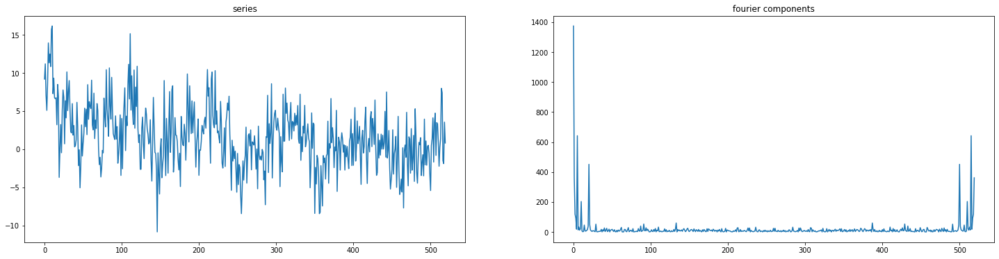

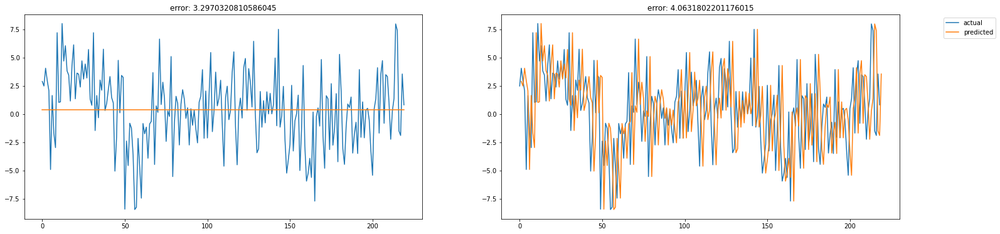

In [31]:
lags=20
complex_fading_series_noise3, X_train, y_train, X_test, y_test, lagged_series_df = new_series(
    trend(resolution, -4, 0, 10) +
    wave(10, resolution, 1) + 
    fading_wave(20, resolution, 3) + 
    wave(5, resolution, 2, np.cos) + 
    noise(resolution, 3),
    scaler, 
    lags=lags)

In [32]:
complex_fading_noise3_result_20_lags_all_models = evaluate_all_models(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test, scaler=scaler, verbose=False, plot=False, print_summary=False, first_hidden_num=20)
complex_fading_noise3_result_20_lags_all_models

,avg,std
Simple_MLP_20_lags,3.340278671746095,0.04727967738849334
Deep_MLP_20_lags,3.2457351520284177,0.0559721488231503
Deep_MLP_Dropout_20_lags,3.207325035995942,0.06703825800630543
RNN_20_lags,3.230439274483733,0.058299257861405836
RNN_RNN_20_lags,3.2632293030341564,0.092090751828256
LSTM_20_lags,3.0802435207397565,0.006198931687906828
GRU_20_lags,3.104963464027102,0.009407832228280765
CNN_Dropout_20_lags,3.214696800604866,0.05647904827550538
CNN_20_lags,3.2062775244069557,0.05731098127558384


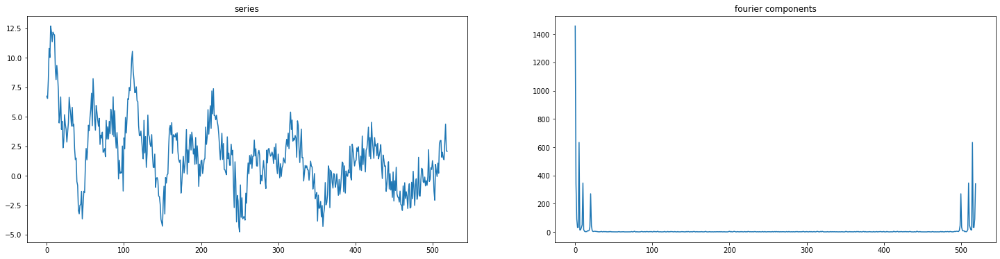

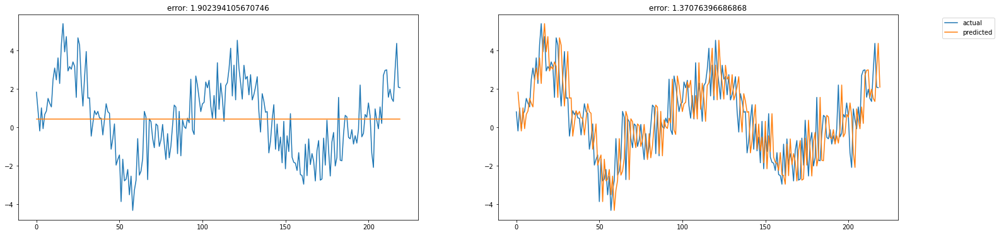

In [33]:
complex_fasing_series_noise3, X_train, y_train, X_test, y_test, lagged_series_df = new_series(
    trend(resolution, -4, 0, 10) +
    fading_wave(20, resolution, 3, reverse = True) + 
    fading_wave(10, resolution, 3) + 
    wave(5, resolution, 2, np.cos) + 
    noise(resolution, 1),
    scaler, 
    lags=lags)

In [34]:
fading_complex_noise1_result_20_lags_all_models = evaluate_all_models(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test, scaler=scaler, verbose=False, plot=False, print_summary=False, first_hidden_num=20)
fading_complex_noise1_result_20_lags_all_models

,avg,std
Simple_MLP_20_lags,1.1759321633564412,0.00886201971266079
Deep_MLP_20_lags,1.1751583950491504,0.015394290667667022
Deep_MLP_Dropout_20_lags,1.17005189221586,0.011407796952031462
RNN_20_lags,1.1590153422690153,0.02385750950760978
RNN_RNN_20_lags,1.1838138874033015,0.007064217877376875
LSTM_20_lags,1.1391547449118946,0.009498633829947811
GRU_20_lags,1.1558246982651,0.00918045155279075
CNN_Dropout_20_lags,1.1670151016253636,0.004023984408108608
CNN_20_lags,1.1699619424654448,0.00848847245208523


Again CNNs and LSTM does the best result. It is interesting to notice that even the simple MLP is quite good.

Looking at the results, we can say that all the networks are quite good in discovering the underlying patterns of the signals. Anyway, if we have a look at the graphic of the fourier components, the signal looks a bit artifical. The main wave components presents spikes that are too clear.

Let's try to mimic a more realistic signal, with more waves of similar magnitude.

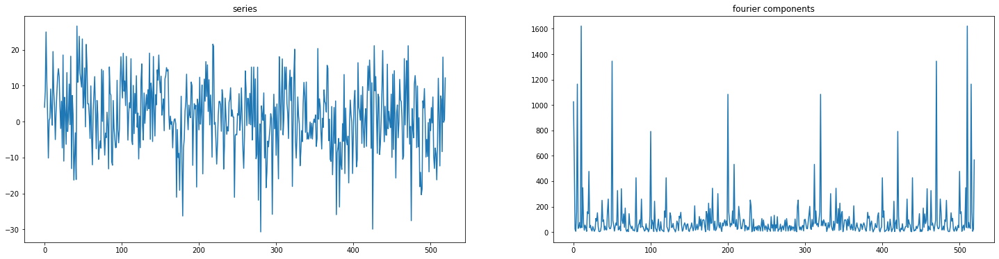

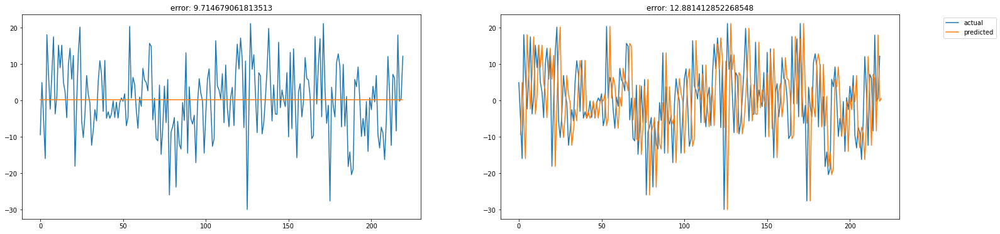

In [35]:
resolution = 520
realistic_series, X_train, y_train, X_test, y_test, lagged_series_df = new_series(
    trend(resolution, -4, 0, 10) +
    wave(10, resolution, 3, np.cos) + 
    wave(20, resolution, 2, np.cos) +
    wave(5, resolution, 2.5, np.sin) + 
    wave(200, resolution, 3, np.sin) + 
    wave(400, resolution, 2, np.sin) + 
    wave(100, resolution, 2, np.sin) + 
    wave(50, resolution, 3, np.sin) +
    noise(resolution, 8),
    scaler, 
    lags=lags)

In [36]:
realistic_result_20_lags_all_models = evaluate_all_models(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test, scaler=scaler, verbose=False, plot=False, print_summary=False, first_hidden_num=20)
realistic_result_20_lags_all_models

,avg,std
Simple_MLP_20_lags,9.647135946926543,0.03886222116774598
Deep_MLP_20_lags,9.606297146760323,0.08221211948650788
Deep_MLP_Dropout_20_lags,9.575329582627145,0.07584600541147107
RNN_20_lags,9.6665639113548,0.07910509596940003
RNN_RNN_20_lags,9.615985939688985,0.11271326131100848
LSTM_20_lags,9.629302147929678,0.019342686013291165
GRU_20_lags,9.65947767647999,0.011683064279440323
CNN_Dropout_20_lags,9.594335767234487,0.023383424451445235
CNN_20_lags,9.574015311268045,0.036522660170270914


Here LSTM does the best, but no model present anything actually satisfying. Let's try to lower the noise.

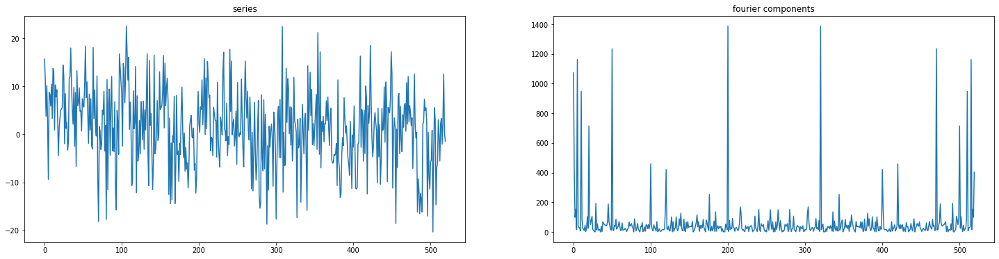

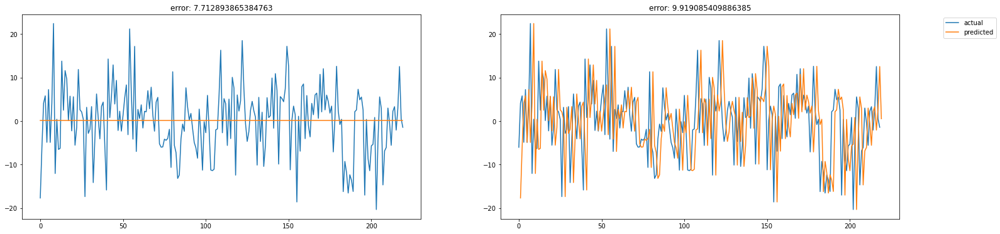

In [37]:
resolution = 520
realistic_series_noise6, X_train, y_train, X_test, y_test, lagged_series_df = new_series(
    trend(resolution, -4, 0, 10) +
    wave(10, resolution, 3, np.cos) + 
    wave(20, resolution, 2, np.cos) +
    wave(5, resolution, 2.5, np.sin) + 
    wave(200, resolution, 3, np.sin) + 
    wave(400, resolution, 2, np.sin) + 
    wave(100, resolution, 2, np.sin) + 
    wave(50, resolution, 3, np.sin) +
    noise(resolution, 6),
    scaler, 
    lags=lags)

In [38]:
lags=20
realistic_noise6_result_20_lags_all_models = evaluate_all_models(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test, scaler=scaler, verbose=False, plot=False, print_summary=False, first_hidden_num=20)
realistic_noise6_result_20_lags_all_models

,avg,std
Simple_MLP_20_lags,7.362820616321562,0.055993438091023966
Deep_MLP_20_lags,7.387183459764143,0.06003696348731604
Deep_MLP_Dropout_20_lags,7.423548453398771,0.07212730736699628
RNN_20_lags,7.302997907774864,0.07550392748758591
RNN_RNN_20_lags,7.389598633439659,0.059436306246755444
LSTM_20_lags,7.52572263320168,0.0037474226917457313
GRU_20_lags,7.520749316645561,0.008534459241539895
CNN_Dropout_20_lags,7.404793533019173,0.01780589393556413
CNN_20_lags,7.388083641449684,0.0526248321383926


Now CNNs wins, but we are still very far from the target noise value.

Up to now we feed the networks only with values coming from the series itself. Does the prediction would improve if we try to include some aggregated information coming from the past of the series?

For example, what if we introduce the average values of the previous 4 lags, the previous 12 lags and the same aggregations, but 48 lags before

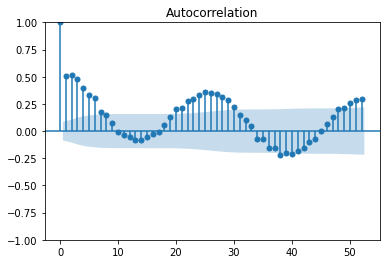

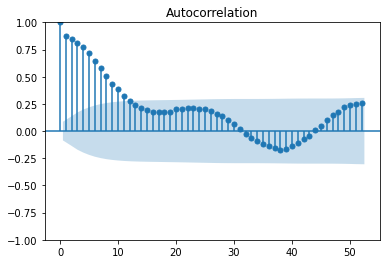

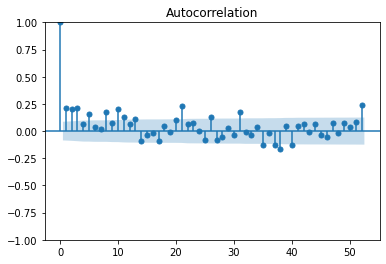

In [39]:
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.tsa.stattools import acf

p1 = plot_acf(complex_series_noise3, lags=52)
p2 = plot_acf(complex_fasing_series_noise3, lags=52)
p3 = plot_acf(realistic_series_noise6, lags=52)

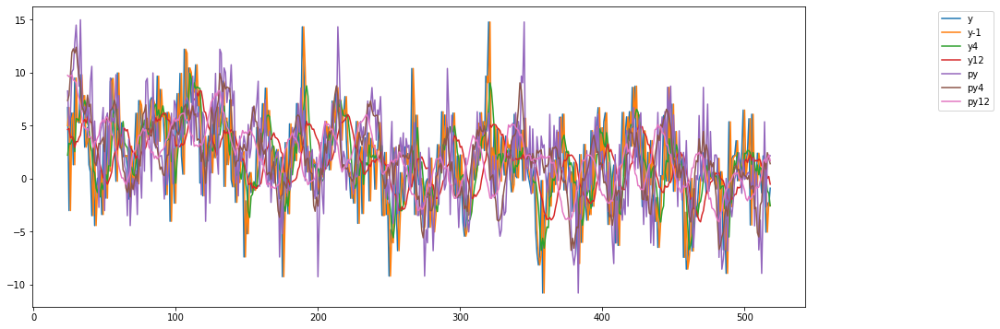

In [40]:
def prepare_data_multivariate(series: np.array):
    series = pd.Series(series)
    series_averages_df = pd.DataFrame({'y-1':series})
    series_averages_df['y4'] = series.rolling(window = 4).mean()
    series_averages_df['y12'] = series.rolling(window = 12).mean()
    
    acf_array = acf(series, nlags=52)
    shift_value = (acf_array[12:].argmax() + 12) - 1
    
    series_averages_df['py'] = series.shift(shift_value)
    series_averages_df['py4'] = series_averages_df['y4'].shift(shift_value - 3)
    series_averages_df['py12'] = series_averages_df['y12'].shift(shift_value - 11)
    series_averages_df['y'] = series.shift(-1)
    
    return series_averages_df.dropna()

multi_series: pd.DataFrame = prepare_data_multivariate(complex_series_noise3)
multi_series.head(10)

plot([multi_series['y'], multi_series['y-1'], multi_series['y4'], multi_series['y12'], multi_series['py'], multi_series['py4'], multi_series['py12']], labels=['y','y-1','y4','y12','py','py4','py12'])
plot_px([multi_series['y'], multi_series['y-1'], multi_series['y4'], multi_series['y12'], multi_series['py'], multi_series['py4'], multi_series['py12']], labels=['y','y-1','y4','y12','py','py4','py12'])

In [41]:
def prepare_lags_multivariate(series: pd.DataFrame, lags: int):
    range_right = lags + 1
    lags_data = np.array([series.shift(range_right - i) for i in range(1, range_right)])
    lags_data = lags_data.transpose(1, 0, 2)
    lags_data = np.array(list(filter(lambda x: not np.isnan(x).any(), lags_data)))
    
    return lags_data, lags_data[:, :, :-1], lags_data[:, :, -1]

def split_test_multivariate(series: np.array, split_percentage=0.8):
    train_len = int(len(series) * split_percentage)
    train = series[:train_len]
    test = series[train_len:]
    
    return train[:, :, :-1], train[:, -1, -1], test[:, :, :-1], test[:, -1, -1], train, test

def new_series_multivariate(series: np.array, scaler: MinMaxScaler, lags=10):
    _, ax = plt.subplots(1, 2, figsize=(25,6))
    ax[0].plot(series)
    ax[0].set_title('series')
    ax[1].plot(fft(series))
    ax[1].set_title('fourier components')
    plt.show()

    scaled_series = scaler.fit_transform(series.reshape(-1, 1)).reshape(-1)
    multivariate_series = prepare_data_multivariate(scaled_series)
    lagged_series, _, _ = prepare_lags_multivariate(multivariate_series, lags=lags)
    X_train, y_train, X_test, y_test, train_df, test_df = split_test_multivariate(lagged_series, 0.6)

    y_test_unscaled = unscale(y_test, scaler)
    
    _, ax = plt.subplots(1, 2, figsize=(25,6))
    evaluate(y_test_unscaled, [y_test_unscaled.mean()] * len(y_test_unscaled), show=False, ax=ax[0])
    evaluate(y_test_unscaled[1:], pd.DataFrame(y_test_unscaled).shift(1).dropna(), show=False, ax=ax[1])
    plt.legend(bbox_to_anchor =(1.25, 1))
    plt.show()
    
    return series, X_train, y_train, X_test, y_test, lagged_series_df

def evaluate_all_models_multivariate(X_train, y_train, X_test, y_test, scaler, verbose=False, plot=True, print_summary=True, first_hidden_num=20):
    lags = X_train.shape[1]
    result = {}

    result.update(evaluate_model(
        5,
        [
            layers.Dense(first_hidden_num, activation=activations.elu),
            layers.Dense(1, activation=activations.linear)
        ], 
        X_train.reshape(X_train.shape[0], X_train.shape[1] * X_train.shape[2]), 
        y_train, 
        X_test.reshape(X_test.shape[0], X_test.shape[1] * X_test.shape[2]), 
        y_test,
        epochs=200,
        batch_size=32,
        name=f'Simple_MLP_{lags}_lags',
        scaler=scaler,
        early_stop=True,
        learning_rate=0.005,
        verbose=verbose,
        print_plot=plot,
        print_summary=print_summary
    ))

    result.update(evaluate_model(
        5,
        [
            layers.Dense(first_hidden_num, activation=activations.elu),
            layers.Dense(100, activation=activations.elu),
            layers.Dense(10, activation=activations.elu),
            layers.Dense(1, activation=activations.linear)
        ], 
        X_train.reshape(X_train.shape[0], X_train.shape[1] * X_train.shape[2]), 
        y_train, 
        X_test.reshape(X_test.shape[0], X_test.shape[1] * X_test.shape[2]), 
        y_test,
        epochs=200,
        batch_size=32,
        name=f'Deep_MLP_{lags}_lags',
        scaler=scaler,
        early_stop=True,
        learning_rate=0.005,
        verbose=verbose,
        print_plot=plot,
        print_summary=print_summary
    ))

    result.update(evaluate_model(
        5,
        [
            layers.Dense(first_hidden_num, activation=activations.elu),
            layers.Dense(100, activation=activations.elu),
            layers.Dropout(0.1),
            layers.Dense(10, activation=activations.elu),
            layers.Dense(1, activation=activations.linear)
        ], 
        X_train.reshape(X_train.shape[0], X_train.shape[1] * X_train.shape[2]), 
        y_train, 
        X_test.reshape(X_test.shape[0], X_test.shape[1] * X_test.shape[2]), 
        y_test,
        epochs=200,
        batch_size=32,
        name=f'Deep_MLP_Dropout_{lags}_lags',
        scaler=scaler,
        early_stop=True,
        learning_rate=0.005,
        verbose=verbose,
        print_plot=plot,
        print_summary=print_summary
    ))

    result.update(evaluate_model(
        5,
        [
            layers.SimpleRNN(first_hidden_num, activation=activations.elu),
            layers.Dense(5, activation=activations.elu),
            layers.Dense(1, activation=activations.linear)
        ], 
        X_train, y_train, X_test, y_test,
        epochs=200,
        batch_size=32,
        name=f'RNN_{lags}_lags',
        scaler=scaler,
        early_stop=True,
        learning_rate=0.005,
        verbose=verbose,
        print_plot=plot,
        print_summary=print_summary
    ))

    result.update(evaluate_model(
        5,
        [
            layers.SimpleRNN(20, activation=activations.elu, return_sequences=True),
            layers.SimpleRNN(10, activation=activations.elu),
            layers.Dense(5, activation=activations.elu),
            layers.Dense(1, activation=activations.linear)
        ], 
        X_train, y_train, X_test, y_test,
        epochs=200,
        batch_size=32,
        name=f'RNN_RNN_{lags}_lags',
        scaler=scaler,
        early_stop=True,
        learning_rate=0.005,
        verbose=verbose,
        print_plot=plot,
        print_summary=print_summary
    ))

    result.update(evaluate_model(
        5,
        [
            layers.LSTM(first_hidden_num, activation=activations.elu),
            layers.Dense(5, activation=activations.elu),
            layers.Dense(1, activation=activations.linear)
        ], 
        X_train, y_train, X_test, y_test,
        epochs=200,
        batch_size=32,
        name=f'LSTM_{lags}_lags',
        scaler=scaler,
        early_stop=True,
        learning_rate=0.005,
        verbose=verbose,
        print_plot=plot,
        print_summary=print_summary
    ))

    result.update(evaluate_model(
        5,
        [
            layers.GRU(first_hidden_num, activation=activations.elu),
            layers.Dense(5, activation=activations.elu),
            layers.Dense(1, activation=activations.linear)
        ], 
        X_train, y_train, X_test, y_test,
        epochs=200,
        batch_size=32,
        name=f'GRU_{lags}_lags',
        scaler=scaler,
        early_stop=True,
        learning_rate=0.005,
        verbose=verbose,
        print_plot=plot,
        print_summary=print_summary
    ))

    result.update(evaluate_model(
        5,
        [
            layers.Conv2D(64, kernel_size=(5,3), activation=activations.elu, padding='same'),
            layers.Flatten(),
            layers.Dense(5, activation=activations.elu),
            layers.Dense(1, activation=activations.linear)
        ], 
        X_train.reshape(X_train.shape[0], X_train.shape[1], X_train.shape[2], 1),
        y_train,
        X_test.reshape(X_test.shape[0], X_test.shape[1], X_test.shape[2], 1), 
        y_test,
        epochs=200,
        batch_size=32,
        name=f'CNN_2D_{lags}_lags',
        scaler=scaler,
        early_stop=True,
        learning_rate=0.005,
        verbose=verbose,
        print_plot=plot,
        print_summary=print_summary
    ))
    
    result.update(evaluate_model(
        5,
        [
            layers.Conv2D(64, kernel_size=(5,3), activation=activations.elu, padding='same'),
            layers.Flatten(),
            layers.Dropout(0.1),
            layers.Dense(5, activation=activations.elu),
            layers.Dense(1, activation=activations.linear)
        ],
        X_train.reshape(X_train.shape[0], X_train.shape[1], X_train.shape[2], 1),
        y_train,
        X_test.reshape(X_test.shape[0], X_test.shape[1], X_test.shape[2], 1), 
        y_test,
        epochs=200,
        batch_size=32,
        name=f'Dropout_CNN_2D_{lags}_lags',
        scaler=scaler,
        early_stop=True,
        learning_rate=0.005,
        verbose=verbose,
        print_plot=plot,
        print_summary=print_summary
    ))
    
    result.update(evaluate_model(
        5,
        [
            layers.Conv2D(64, kernel_size=(10,5), input_shape=(X_train.shape[1], X_train.shape[2], 1), activation=activations.elu, padding='same'),
            layers.MaxPooling2D(pool_size=(2,2), strides=[2, 2]),
            layers.Conv2D(64, kernel_size=(5,3), activation=activations.elu),
            layers.Flatten(),
            layers.Dropout(0.1),
            layers.Dense(5, activation=activations.elu),
            layers.Dense(1, activation=activations.linear)
        ],
        X_train.reshape(X_train.shape[0], X_train.shape[1], X_train.shape[2], 1),
        y_train,
        X_test.reshape(X_test.shape[0], X_test.shape[1], X_test.shape[2], 1), 
        y_test,
        epochs=200,
        batch_size=32,
        name=f'Deep_CNN_2D_{lags}_lags',
        scaler=scaler,
        early_stop=True,
        learning_rate=0.005,
        verbose=verbose,
        print_plot=plot,
        print_summary=print_summary
    ))
    
    
    result2 = np.array([[k, v[1], v[2]] for k,v in zip(result.keys(), result.values())])
    return pd.DataFrame({'avg': result2[:, 1], 'std': result2[:, 2]}, index = result2[:, 0])

Look that all the models improves when feeding a multivariate series. The models that benefit the most are the MLP models, with Deep_MLP_Dropout_20_lags that now performs even better then CNN and LSTM.

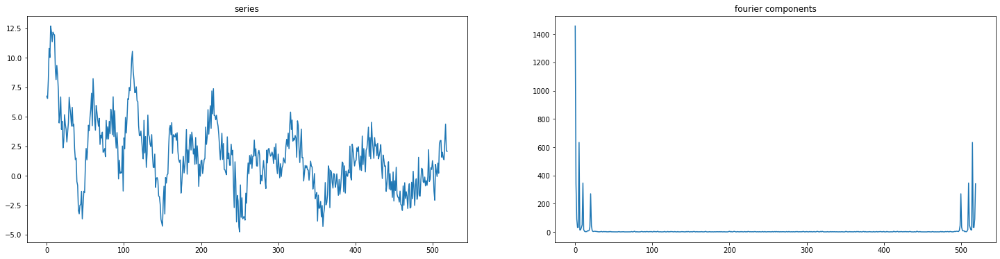

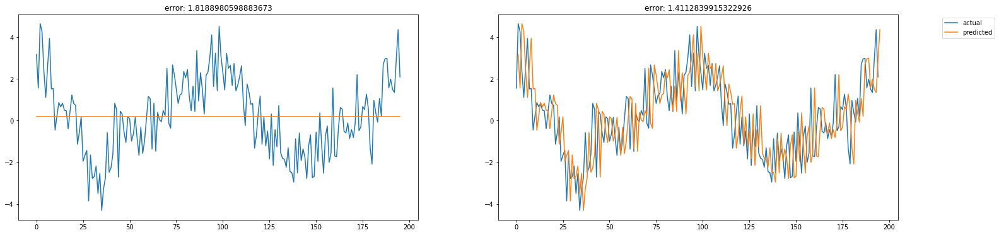

,avg,std
Simple_MLP_20_lags,1.1617723316191044,0.008722806842654248
Deep_MLP_20_lags,1.153691333196644,0.014575103228885075
Deep_MLP_Dropout_20_lags,1.155877014527078,0.008898744121496258
RNN_20_lags,1.2096756453976887,0.01284172187559608
RNN_RNN_20_lags,1.1966540520429185,0.009746322839778606
LSTM_20_lags,1.1596048897655766,0.012449719118518518
GRU_20_lags,1.1962416615430702,0.009361991040067966
CNN_2D_20_lags,1.1834149586592813,0.023269924240407948
Dropout_CNN_2D_20_lags,1.1554733307162963,0.010776846547533225
Deep_CNN_2D_20_lags,1.1549010233722143,0.015547921126468198


In [42]:
lags=20
complex_fasing_series_noise3, X_train, y_train, X_test, y_test, lagged_series_df = new_series_multivariate(complex_fasing_series_noise3, scaler, lags)
complex_fasing_series_noise3_result_20_lags_all_models = evaluate_all_models_multivariate(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test, scaler=scaler, verbose=False, plot=False, print_summary=False)
complex_fasing_series_noise3_result_20_lags_all_models

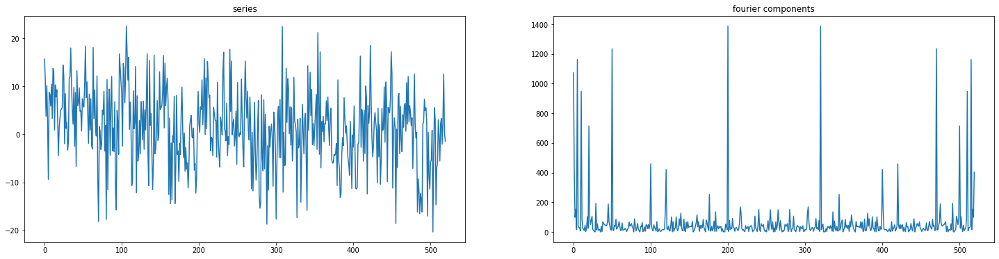

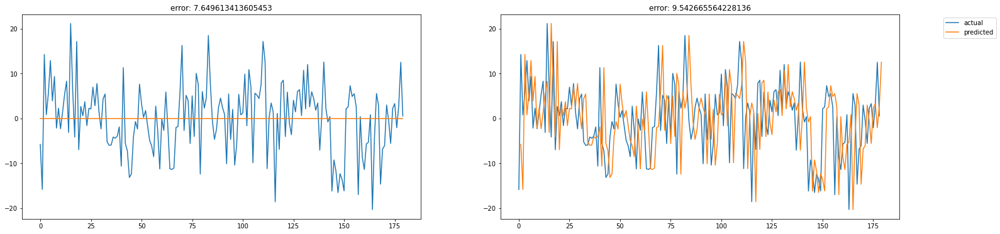

,avg,std
Simple_MLP_20_lags,7.146585474125105,0.09144880879666026
Deep_MLP_20_lags,7.132057890419077,0.11067626977379728
Deep_MLP_Dropout_20_lags,7.058131035488222,0.052913923377449636
RNN_20_lags,7.29836339925957,0.1415546878869773
RNN_RNN_20_lags,7.238313462791046,0.180856490705867
LSTM_20_lags,7.256483141218818,0.02397593609404807
GRU_20_lags,7.228704888204456,0.03179724452769143
CNN_2D_20_lags,7.138135146216342,0.04277944814115525
Dropout_CNN_2D_20_lags,7.422813808558288,0.3297273621867957
Deep_CNN_2D_20_lags,7.224409823942129,0.21464147580512108


In [43]:
lags=20
realistic_noise6_multivariate, X_train, y_train, X_test, y_test, lagged_series_df = new_series_multivariate(realistic_series_noise6, scaler, lags)
realistic_noise6_multivariate_result_20_lags_all_models = evaluate_all_models_multivariate(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test, scaler=scaler, verbose=False, plot=False, print_summary=False)
realistic_noise6_multivariate_result_20_lags_all_models

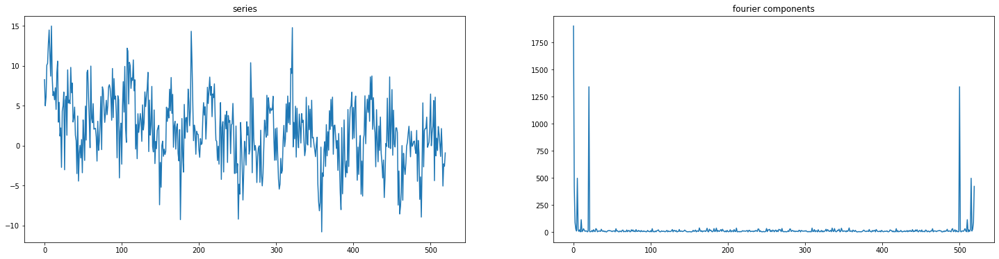

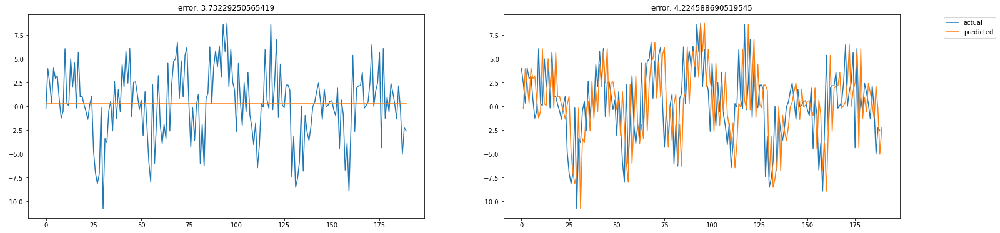

,avg,std
Simple_MLP_20_lags,3.248927643469012,0.033552583686396034
Deep_MLP_20_lags,3.1974231632621497,0.015489317811919255
Deep_MLP_Dropout_20_lags,3.180338644923609,0.034784656109696756
RNN_20_lags,3.2801389355805077,0.019123544186205422
RNN_RNN_20_lags,3.263979072283212,0.05842239752274845
LSTM_20_lags,3.1341849567725264,0.02092444717445748
GRU_20_lags,3.199099511622916,0.036219619372020846
CNN_2D_20_lags,3.541007574404098,0.41760983480707403
Dropout_CNN_2D_20_lags,3.205442257708043,0.04049874790443371
Deep_CNN_2D_20_lags,3.215893514017683,0.046616076163670084


In [44]:
complex_series_noise3_multivariate, X_train, y_train, X_test, y_test, lagged_series_df = new_series_multivariate(complex_series_noise3, scaler, lags)
complex_multivariate_noise3_result_20_lags_all_models = evaluate_all_models_multivariate(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test, scaler=scaler, verbose=False, plot=False, print_summary=False)
complex_multivariate_noise3_result_20_lags_all_models

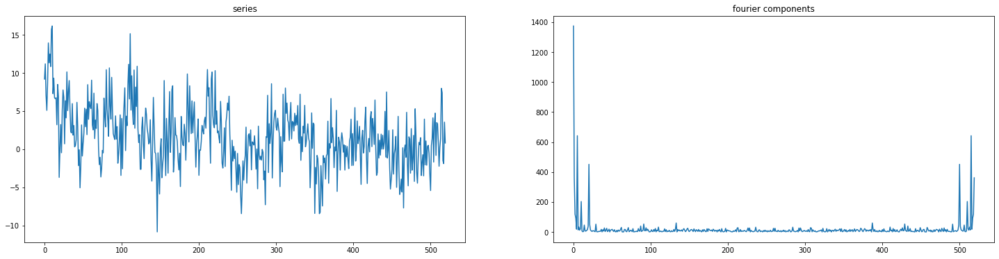

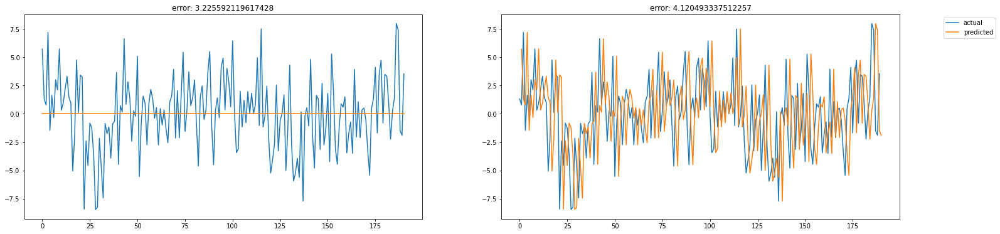

,avg,std
Simple_MLP_20_lags,3.284597687357595,0.0692167916327135
Deep_MLP_20_lags,3.175361284253147,0.028854357309270075
Deep_MLP_Dropout_20_lags,3.171760383456851,0.048609558462527236
RNN_20_lags,3.239834882135218,0.028774370348286893
RNN_RNN_20_lags,3.2157449484322407,0.03806296966047219
LSTM_20_lags,3.1257556538689735,0.009900173947329607
GRU_20_lags,3.159698044948565,0.02791078626471096
CNN_2D_20_lags,3.34511632421775,0.20017465041353272
Dropout_CNN_2D_20_lags,3.195558945394499,0.03901790694062692
Deep_CNN_2D_20_lags,3.189259563413953,0.06355590490006267


In [45]:
complex_fading_series_noise3_multivariate, X_train, y_train, X_test, y_test, lagged_series_df = new_series_multivariate(complex_fading_series_noise3, scaler, lags)
complex_fading_multivariate_noise3_result_20_lags_all_models = evaluate_all_models_multivariate(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test, scaler=scaler, verbose=False, plot=False, print_summary=False)
complex_fading_multivariate_noise3_result_20_lags_all_models

Let's also try a convolutional LSTM. We will see no real improvement.

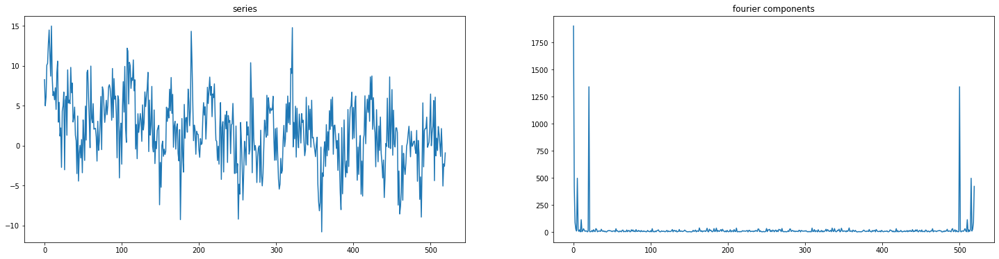

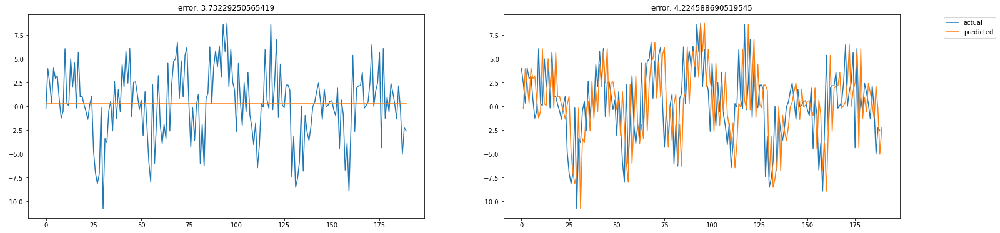

Model: "ConvLSTM2D_20_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_lstm2d (ConvLSTM2D)    (None, 1, 6, 10)          6640      
                                                                 
 flatten_34 (Flatten)        (None, 60)                0         
                                                                 
 dropout_34 (Dropout)        (None, 60)                0         
                                                                 
 dense_350 (Dense)           (None, 5)                 305       
                                                                 
 dense_351 (Dense)           (None, 1)                 6         
                                                                 
Total params: 6,951
Trainable params: 6,951
Non-trainable params: 0
_________________________________________________________________
errors: [3.1347324027292913, 3.154997436010482

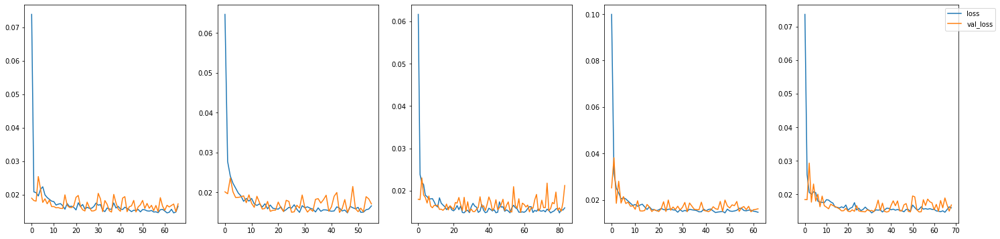

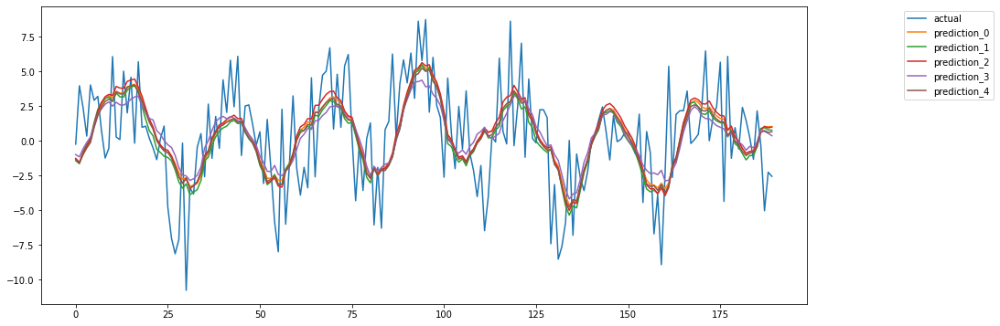

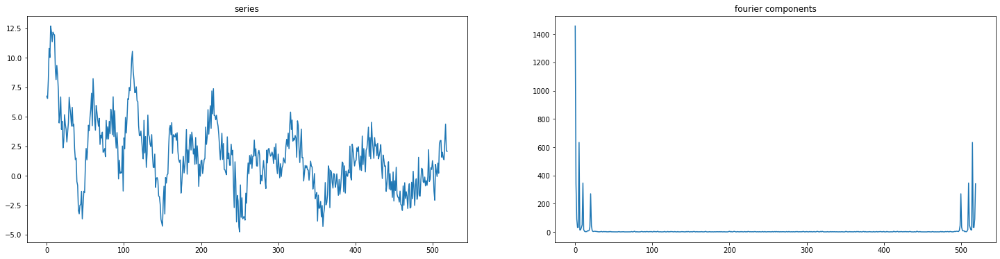

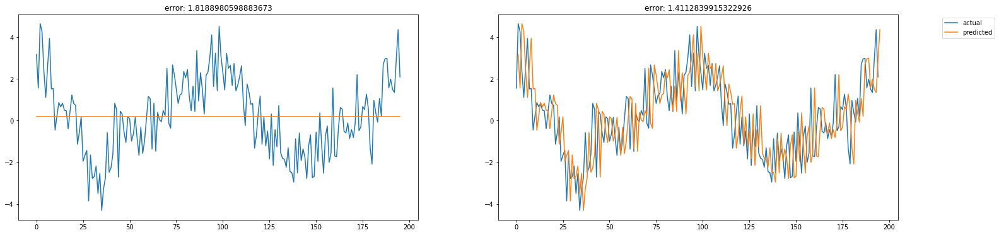

Model: "ConvLSTM2D_20_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_lstm2d_1 (ConvLSTM2D)  (None, 1, 6, 10)          6640      
                                                                 
 flatten_35 (Flatten)        (None, 60)                0         
                                                                 
 dropout_35 (Dropout)        (None, 60)                0         
                                                                 
 dense_352 (Dense)           (None, 5)                 305       
                                                                 
 dense_353 (Dense)           (None, 1)                 6         
                                                                 
Total params: 6,951
Trainable params: 6,951
Non-trainable params: 0
_________________________________________________________________
errors: [1.1579773284182255, 1.164008858234462

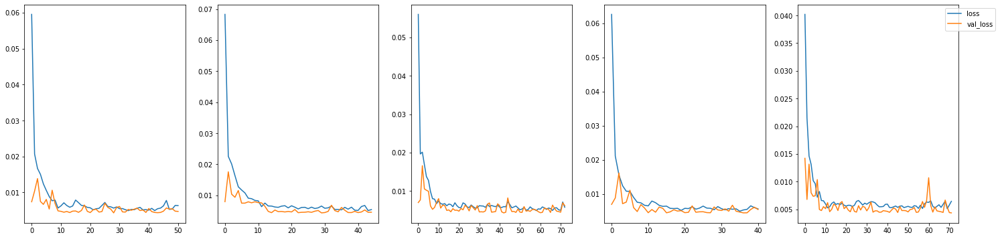

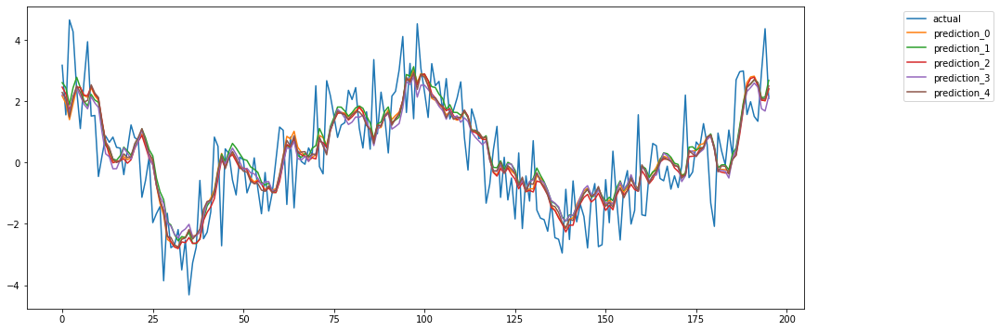

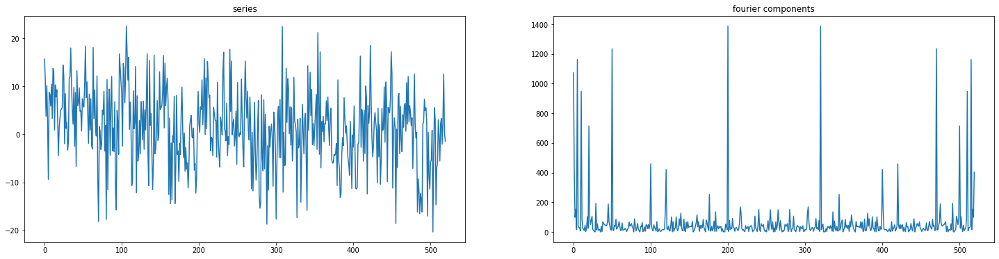

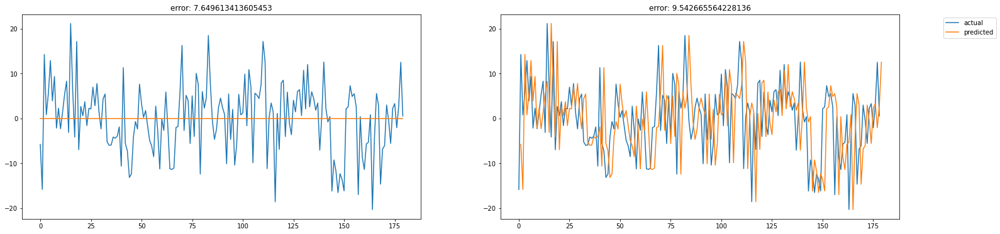

Model: "ConvLSTM2D_20_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_lstm2d_2 (ConvLSTM2D)  (None, 1, 6, 10)          6640      
                                                                 
 flatten_36 (Flatten)        (None, 60)                0         
                                                                 
 dropout_36 (Dropout)        (None, 60)                0         
                                                                 
 dense_354 (Dense)           (None, 5)                 305       
                                                                 
 dense_355 (Dense)           (None, 1)                 6         
                                                                 
Total params: 6,951
Trainable params: 6,951
Non-trainable params: 0
_________________________________________________________________
errors: [7.227164680782503, 7.228228251834036,

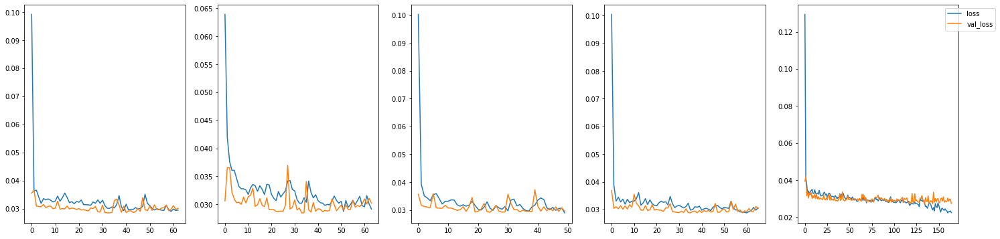

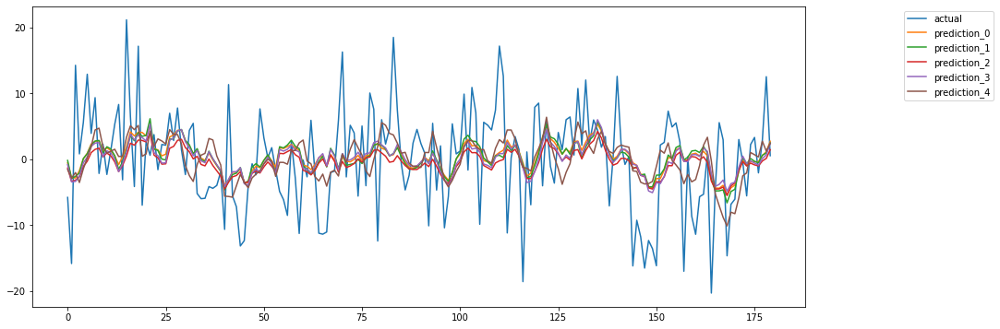

In [46]:

def evaluate_CONV_LSTM(series: np.array, scaler: MinMaxScaler, lags: int):    
    _, X_train, y_train, X_test, y_test, _ = new_series_multivariate(series, scaler, lags)
    evaluate_model(
        5,
        [
            layers.ConvLSTM2D(10, kernel_size=(5,3), activation=activations.elu, padding='same'),
            layers.Flatten(),
            layers.Dropout(0.1),
            layers.Dense(5, activation=activations.elu),
            layers.Dense(1, activation=activations.linear)
        ],
        X_train.reshape(X_train.shape[0], X_train.shape[1], 1, X_train.shape[2], 1),
        y_train,
        X_test.reshape(X_test.shape[0], X_test.shape[1], 1, X_test.shape[2], 1),
        y_test,
        epochs=200,
        batch_size=32,
        name=f'ConvLSTM2D_{lags}_lags',
        scaler=scaler,
        early_stop=True,
        learning_rate=0.01,
        verbose=False,
        print_plot=True,
        print_summary=True
    )
    
lags=20
evaluate_CONV_LSTM(complex_series_noise3, scaler, lags)
evaluate_CONV_LSTM(complex_fasing_series_noise3, scaler, lags)
evaluate_CONV_LSTM(realistic_series_noise6, scaler, lags)


Now, some random experiments.

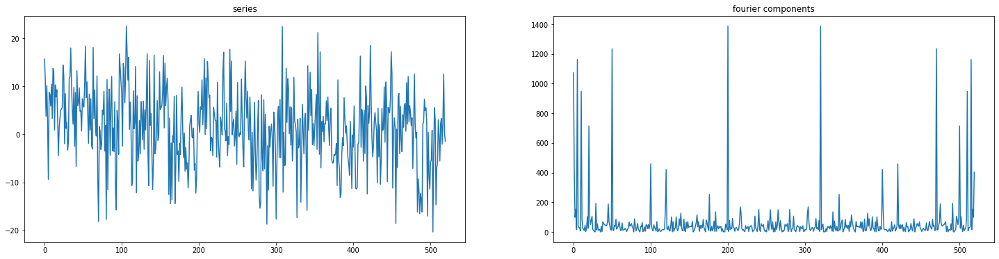

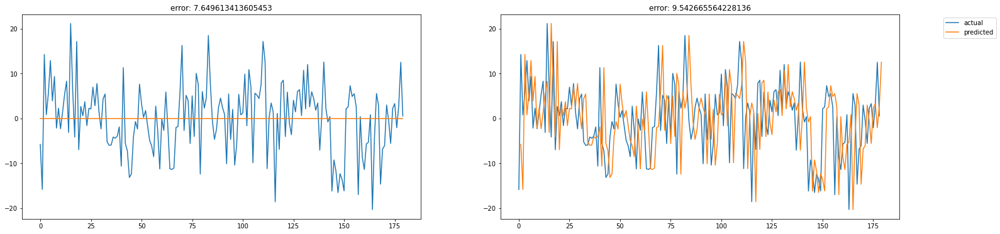

Model: "Simple_MLP_20_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_356 (Dense)           (None, 20)                2420      
                                                                 
 dense_357 (Dense)           (None, 1)                 21        
                                                                 
Total params: 2,441
Trainable params: 2,441
Non-trainable params: 0
_________________________________________________________________
errors: [7.250756260709842, 7.131509467912912, 7.261028257399824, 7.276543271757019, 7.137909117363464]
error avg: 7.211549275028612
error std: 0.06330690416928828


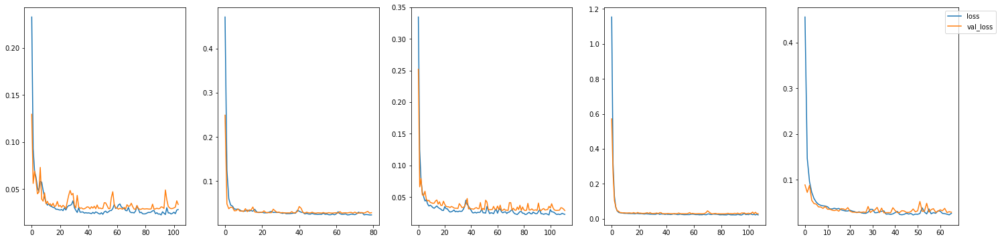

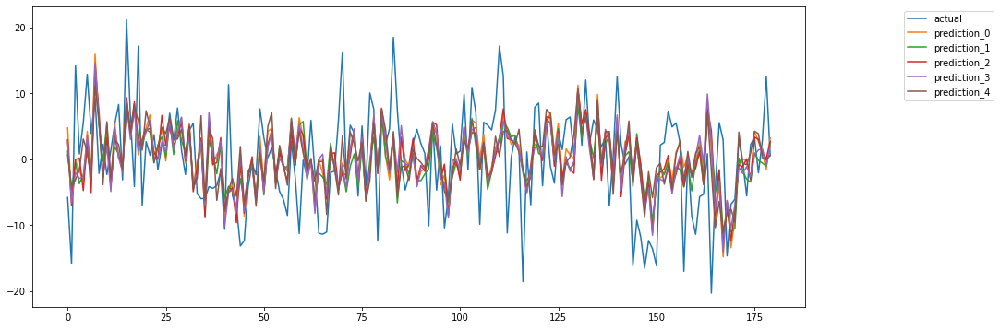

Model: "Deep_MLP_20_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_358 (Dense)           (None, 20)                2420      
                                                                 
 dense_359 (Dense)           (None, 100)               2100      
                                                                 
 dense_360 (Dense)           (None, 10)                1010      
                                                                 
 dense_361 (Dense)           (None, 1)                 11        
                                                                 
Total params: 5,541
Trainable params: 5,541
Non-trainable params: 0
_________________________________________________________________
errors: [7.164192691826305, 7.045402750120189, 7.103886192458369, 6.988652033464223, 7.120679114904993]
error avg: 7.0845625565548165
error std: 0.06123901699808562


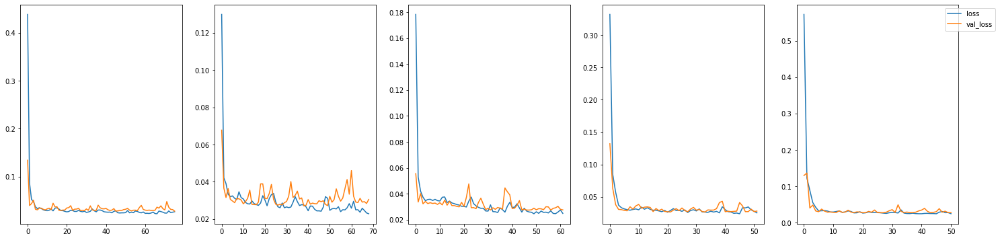

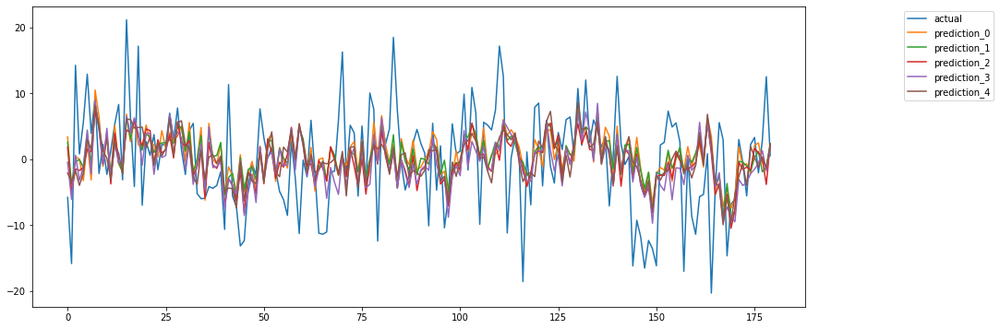

Model: "Deep_MLP_Dropout_20_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_362 (Dense)           (None, 20)                2420      
                                                                 
 dense_363 (Dense)           (None, 100)               2100      
                                                                 
 dropout_37 (Dropout)        (None, 100)               0         
                                                                 
 dense_364 (Dense)           (None, 10)                1010      
                                                                 
 dense_365 (Dense)           (None, 1)                 11        
                                                                 
Total params: 5,541
Trainable params: 5,541
Non-trainable params: 0
_________________________________________________________________
errors: [6.972838141879439, 7.1246348882

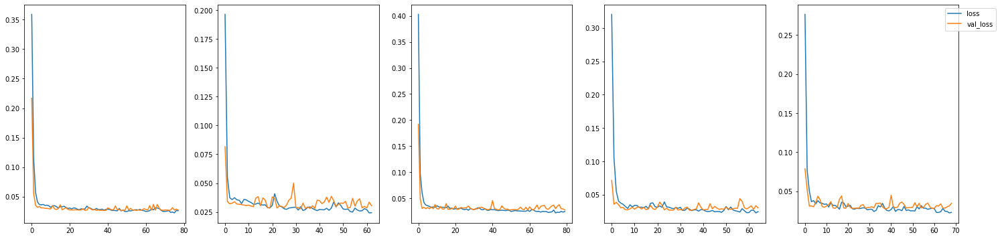

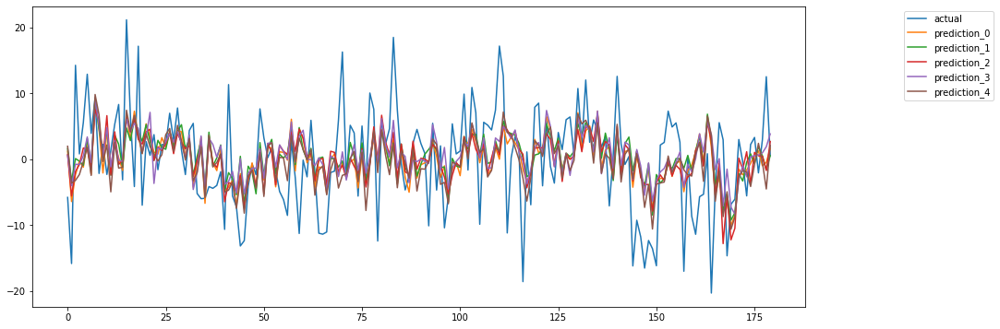

Model: "RNN_20_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 simple_rnn_45 (SimpleRNN)   (None, 20)                540       
                                                                 
 dense_366 (Dense)           (None, 5)                 105       
                                                                 
 dense_367 (Dense)           (None, 1)                 6         
                                                                 
Total params: 651
Trainable params: 651
Non-trainable params: 0
_________________________________________________________________
errors: [7.269094745287972, 7.285256559036869, 7.2013253073035015, 7.222631871019979, 7.303028333387274]
error avg: 7.256267363207118
error std: 0.03831834907633805


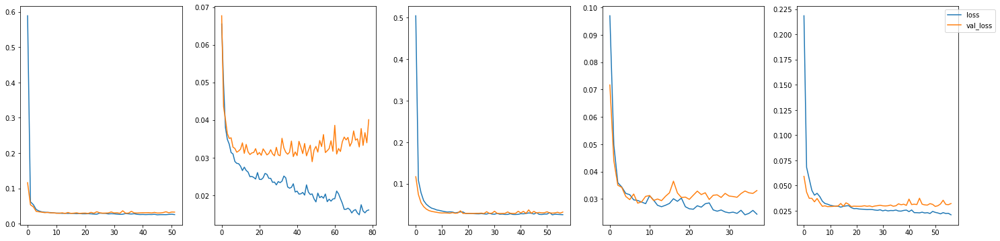

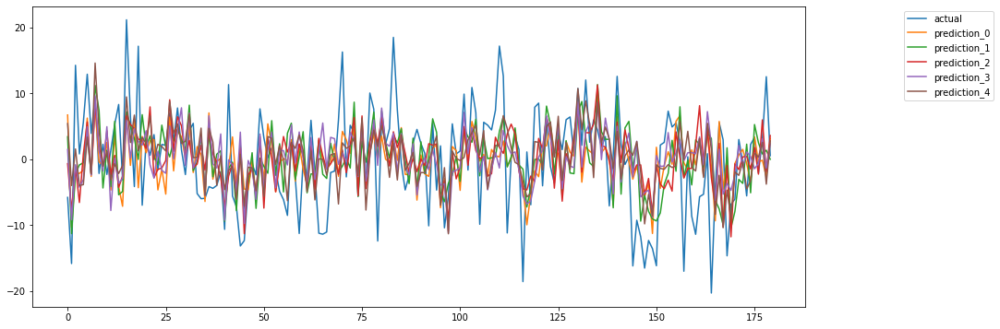

Model: "RNN_RNN_20_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 simple_rnn_46 (SimpleRNN)   (None, 20, 20)            540       
                                                                 
 simple_rnn_47 (SimpleRNN)   (None, 10)                310       
                                                                 
 dense_368 (Dense)           (None, 5)                 55        
                                                                 
 dense_369 (Dense)           (None, 1)                 6         
                                                                 
Total params: 911
Trainable params: 911
Non-trainable params: 0
_________________________________________________________________
errors: [7.196004276161282, 7.203149389042774, 7.498002881687426, 7.346063903711422, 7.2649520980042706]
error avg: 7.301634509721434
error std: 0.11201533209819252


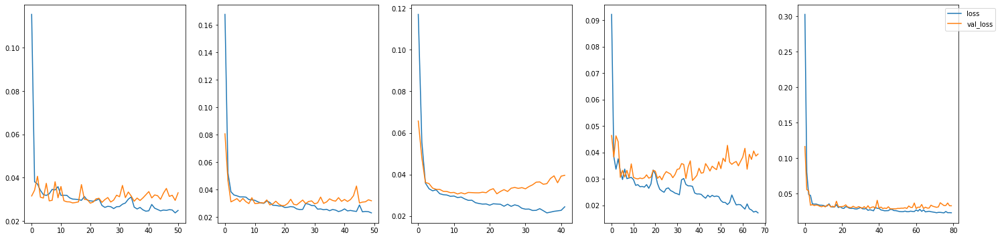

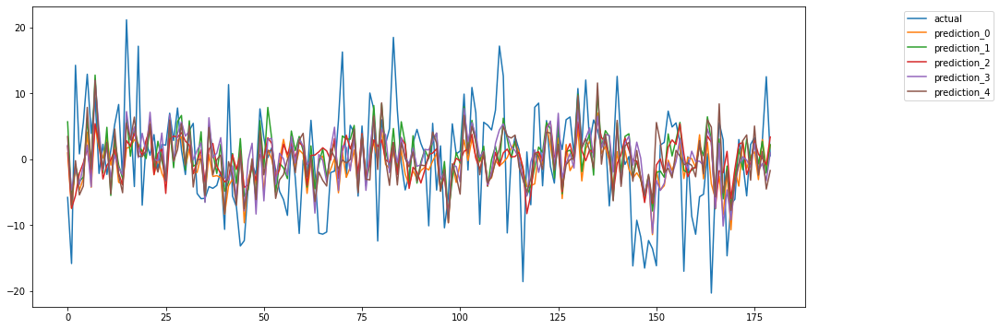

Model: "LSTM_20_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_15 (LSTM)              (None, 20)                2160      
                                                                 
 dense_370 (Dense)           (None, 5)                 105       
                                                                 
 dense_371 (Dense)           (None, 1)                 6         
                                                                 
Total params: 2,271
Trainable params: 2,271
Non-trainable params: 0
_________________________________________________________________
errors: [7.22174612919247, 7.221202606772869, 7.280300493006024, 7.297627076223039, 7.2529799206324785]
error avg: 7.254771245165375
error std: 0.030689038313655676


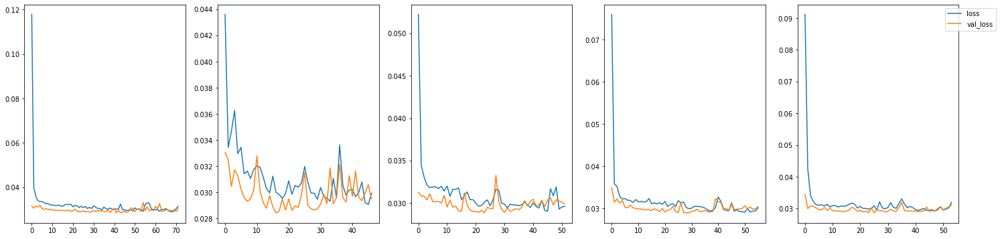

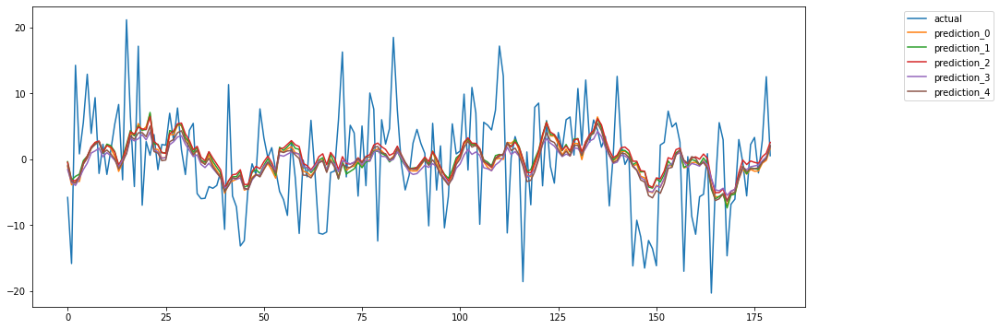

Model: "GRU_20_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru_15 (GRU)                (None, 20)                1680      
                                                                 
 dense_372 (Dense)           (None, 5)                 105       
                                                                 
 dense_373 (Dense)           (None, 1)                 6         
                                                                 
Total params: 1,791
Trainable params: 1,791
Non-trainable params: 0
_________________________________________________________________
errors: [7.237980172484374, 7.175184047739814, 7.270992904957227, 7.162175140321694, 7.209608264526918]
error avg: 7.211188106006006
error std: 0.03998871770808159


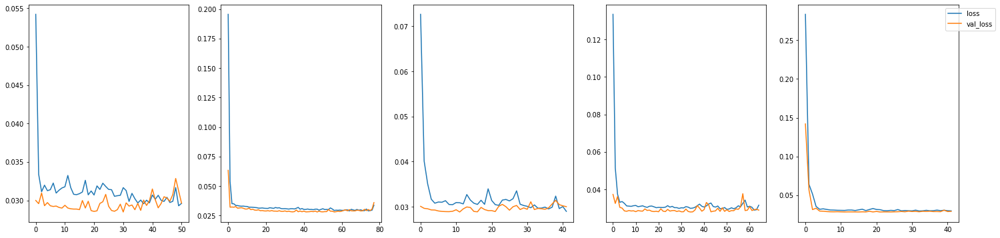

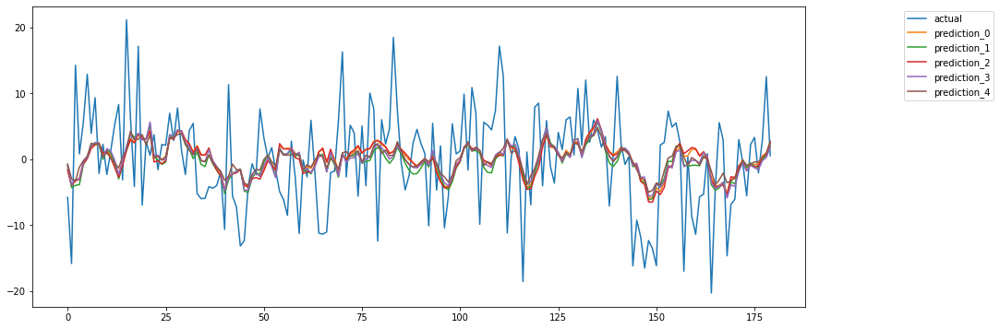

Model: "CNN_2D_20_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_16 (Conv2D)          (None, 20, 6, 64)         1024      
                                                                 
 flatten_37 (Flatten)        (None, 7680)              0         
                                                                 
 dense_374 (Dense)           (None, 5)                 38405     
                                                                 
 dense_375 (Dense)           (None, 1)                 6         
                                                                 
Total params: 39,435
Trainable params: 39,435
Non-trainable params: 0
_________________________________________________________________
errors: [7.118674724010718, 7.135310734123982, 7.022907836414388, 7.03298061703944, 6.974813804034891]
error avg: 7.056937543124684
error std: 0.06071260221650567


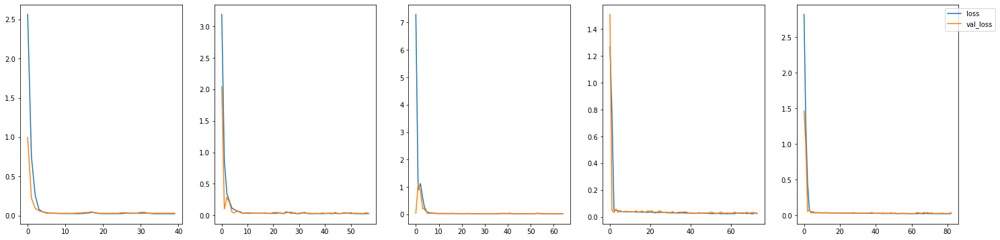

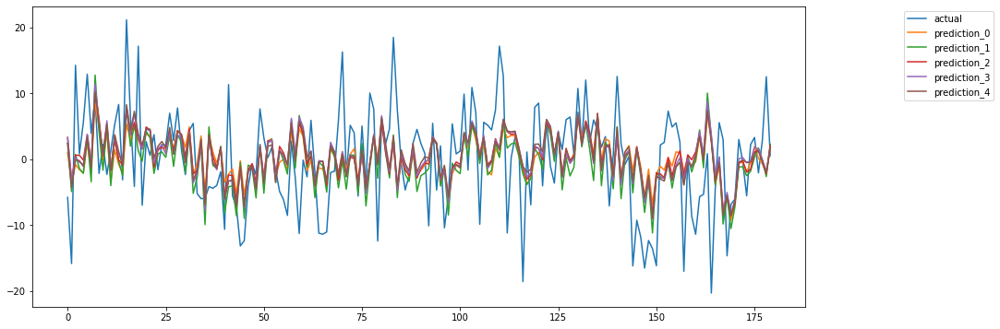

Model: "Dropout_CNN_2D_20_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_17 (Conv2D)          (None, 20, 6, 64)         1024      
                                                                 
 flatten_38 (Flatten)        (None, 7680)              0         
                                                                 
 dropout_38 (Dropout)        (None, 7680)              0         
                                                                 
 dense_376 (Dense)           (None, 5)                 38405     
                                                                 
 dense_377 (Dense)           (None, 1)                 6         
                                                                 
Total params: 39,435
Trainable params: 39,435
Non-trainable params: 0
_________________________________________________________________
errors: [7.016921273596047, 7.1279249851

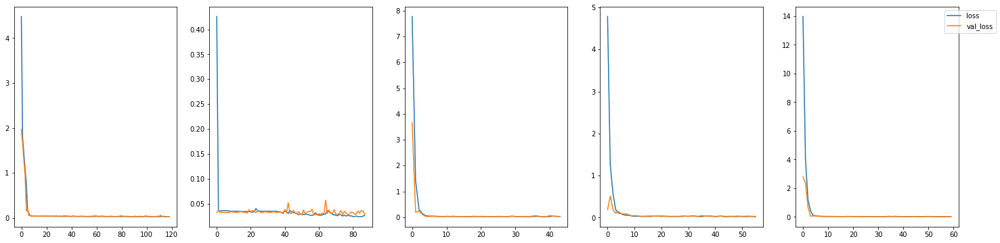

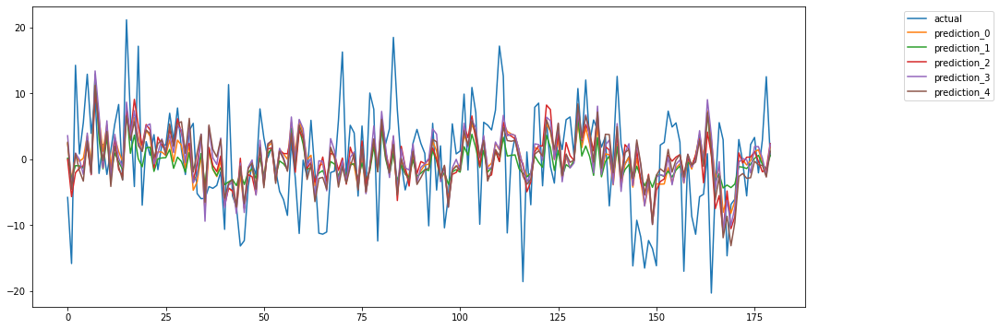

Model: "Deep_CNN_2D_20_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_18 (Conv2D)          (None, 20, 6, 64)         3264      
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 10, 3, 64)        0         
 2D)                                                             
                                                                 
 conv2d_19 (Conv2D)          (None, 6, 1, 64)          61504     
                                                                 
 flatten_39 (Flatten)        (None, 384)               0         
                                                                 
 dropout_39 (Dropout)        (None, 384)               0         
                                                                 
 dense_378 (Dense)           (None, 5)                 1925      
                                               

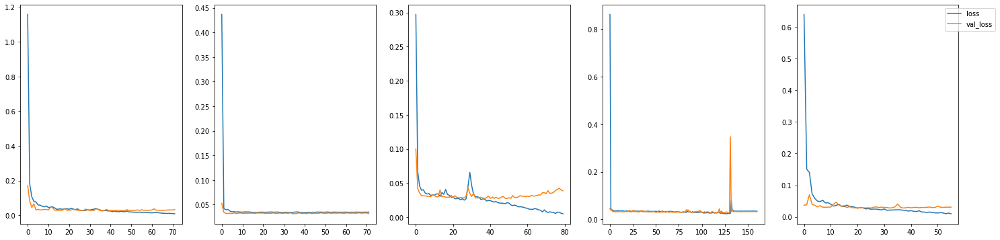

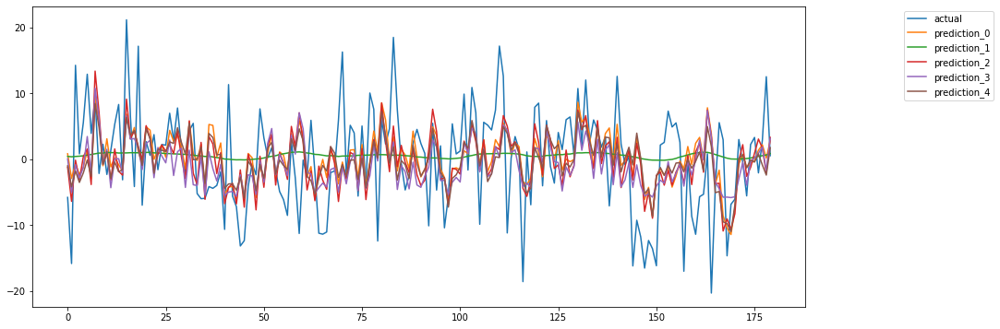

,avg,std
Simple_MLP_20_lags,7.211549275028612,0.06330690416928828
Deep_MLP_20_lags,7.0845625565548165,0.06123901699808562
Deep_MLP_Dropout_20_lags,7.067739119398963,0.06325432868030899
RNN_20_lags,7.256267363207118,0.03831834907633805
RNN_RNN_20_lags,7.301634509721434,0.11201533209819252
LSTM_20_lags,7.254771245165375,0.030689038313655676
GRU_20_lags,7.211188106006006,0.03998871770808159
CNN_2D_20_lags,7.056937543124684,0.06071260221650567
Dropout_CNN_2D_20_lags,7.107882732295385,0.0558856528755558
Deep_CNN_2D_20_lags,7.224464211286927,0.1894954918213601


In [47]:
realistic_noise6_multivariate, X_train, y_train, X_test, y_test, lagged_series_df = new_series_multivariate(realistic_series_noise6, scaler, lags)
realistic_noise6_multivariate_result_20_lags_all_models = evaluate_all_models_multivariate(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test, scaler=scaler, verbose=False, plot=True, print_summary=True)
realistic_noise6_multivariate_result_20_lags_all_models

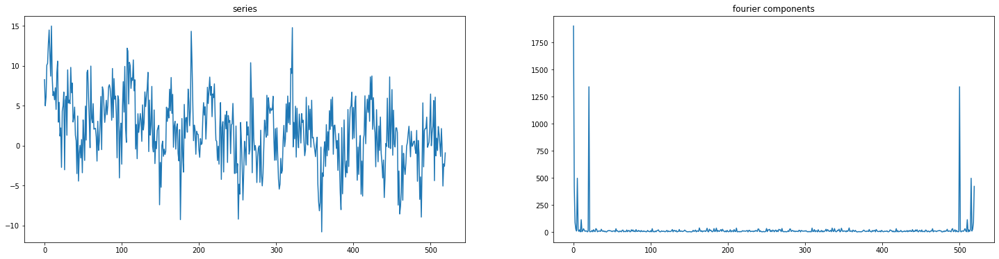

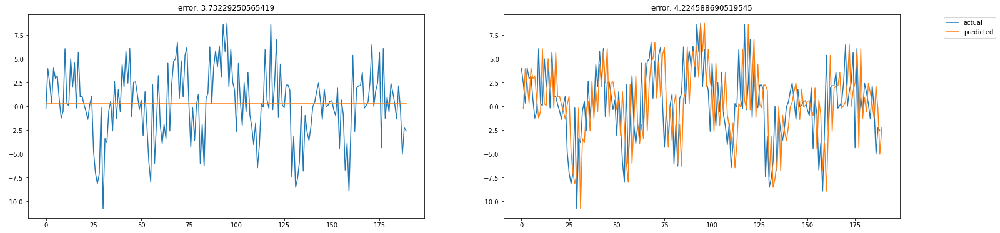

Model: "Simple_MLP_20_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_380 (Dense)           (None, 20)                2420      
                                                                 
 dense_381 (Dense)           (None, 1)                 21        
                                                                 
Total params: 2,441
Trainable params: 2,441
Non-trainable params: 0
_________________________________________________________________
errors: [3.228492504134032, 3.2713680089066965, 3.1617516699606054, 3.2662561740107794, 3.279946165660072]
error avg: 3.2415629045344367
error std: 0.04361661396655481


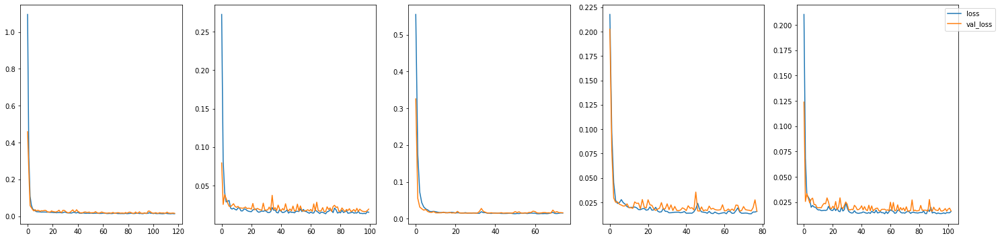

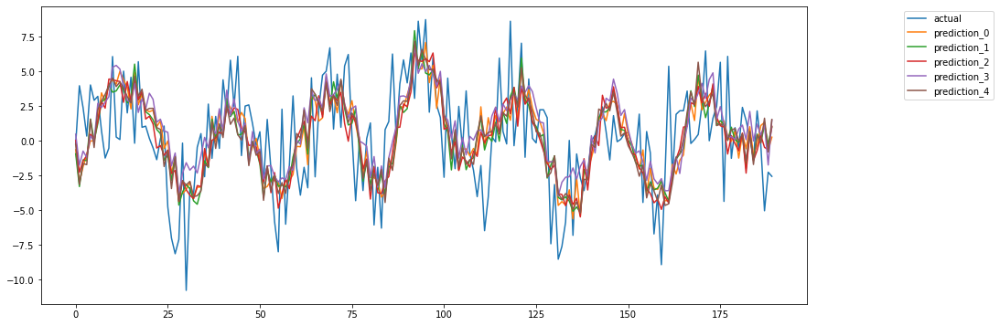

Model: "Deep_MLP_20_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_382 (Dense)           (None, 20)                2420      
                                                                 
 dense_383 (Dense)           (None, 100)               2100      
                                                                 
 dense_384 (Dense)           (None, 10)                1010      
                                                                 
 dense_385 (Dense)           (None, 1)                 11        
                                                                 
Total params: 5,541
Trainable params: 5,541
Non-trainable params: 0
_________________________________________________________________
errors: [3.167451325575338, 3.184441616353389, 3.249366707923477, 3.2634293201675, 3.181146784586301]
error avg: 3.2091671509212008
error std: 0.03923541886608539


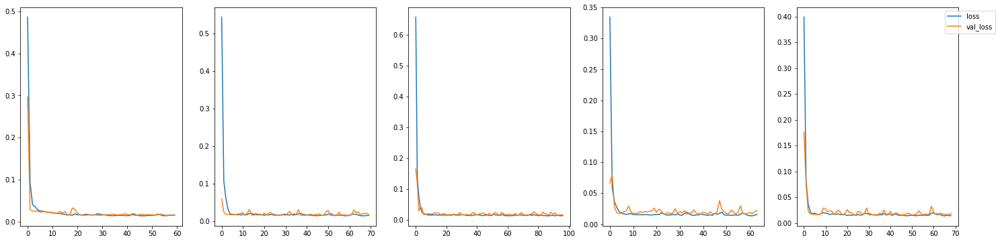

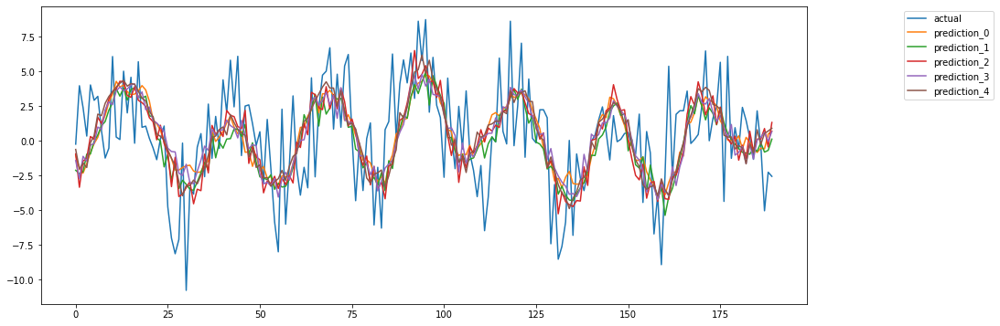

Model: "Deep_MLP_Dropout_20_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_386 (Dense)           (None, 20)                2420      
                                                                 
 dense_387 (Dense)           (None, 100)               2100      
                                                                 
 dropout_40 (Dropout)        (None, 100)               0         
                                                                 
 dense_388 (Dense)           (None, 10)                1010      
                                                                 
 dense_389 (Dense)           (None, 1)                 11        
                                                                 
Total params: 5,541
Trainable params: 5,541
Non-trainable params: 0
_________________________________________________________________
errors: [3.1372622477201784, 3.178229301

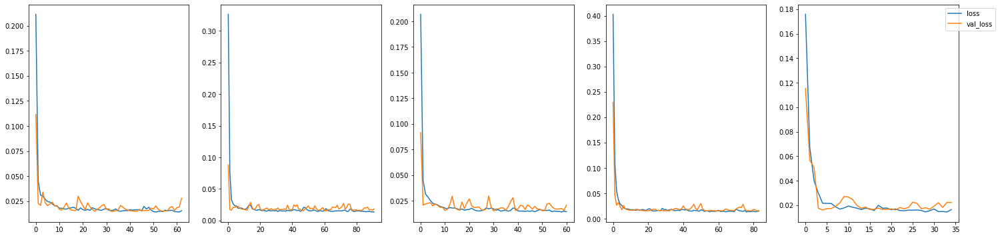

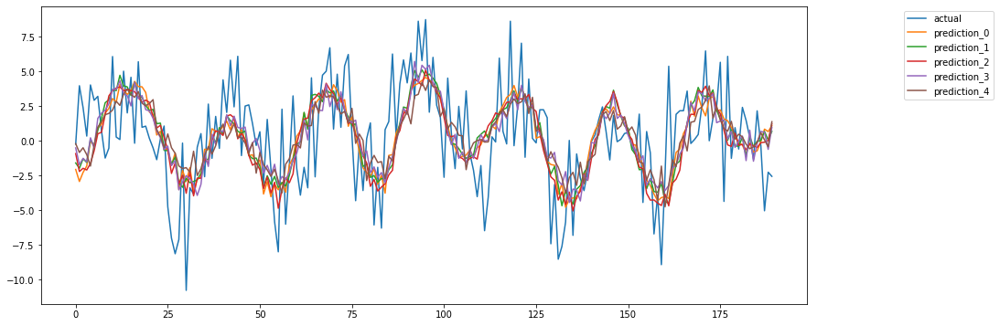

Model: "RNN_20_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 simple_rnn_48 (SimpleRNN)   (None, 20)                540       
                                                                 
 dense_390 (Dense)           (None, 5)                 105       
                                                                 
 dense_391 (Dense)           (None, 1)                 6         
                                                                 
Total params: 651
Trainable params: 651
Non-trainable params: 0
_________________________________________________________________
errors: [3.4848899141518963, 3.2007989999090958, 3.3068820552021676, 3.2301326089457905, 3.329037955112745]
error avg: 3.310348306664339
error std: 0.09925895362504328


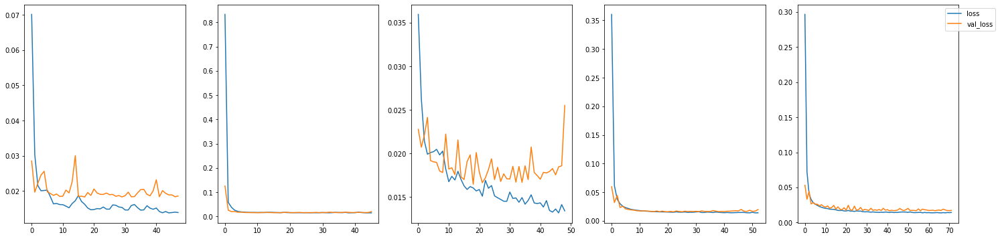

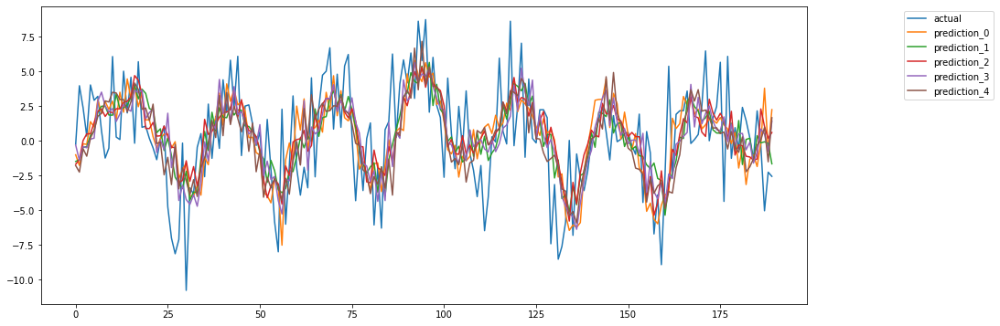

Model: "RNN_RNN_20_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 simple_rnn_49 (SimpleRNN)   (None, 20, 20)            540       
                                                                 
 simple_rnn_50 (SimpleRNN)   (None, 10)                310       
                                                                 
 dense_392 (Dense)           (None, 5)                 55        
                                                                 
 dense_393 (Dense)           (None, 1)                 6         
                                                                 
Total params: 911
Trainable params: 911
Non-trainable params: 0
_________________________________________________________________
errors: [3.3029281588163295, 3.280105650557763, 3.3077956929607932, 3.262706141166505, 3.38928061805452]
error avg: 3.308563252311182
error std: 0.04349792247610761


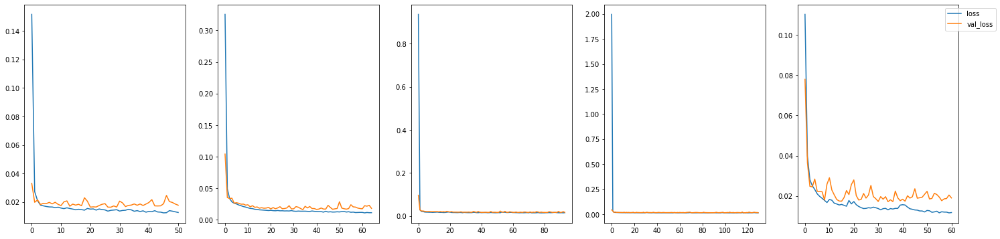

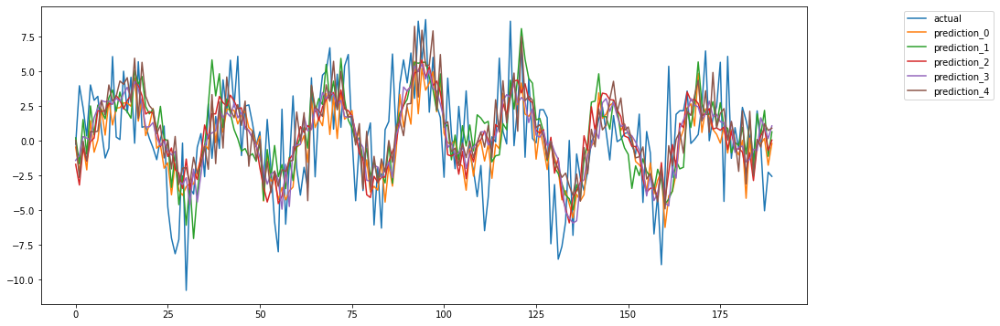

Model: "LSTM_20_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_16 (LSTM)              (None, 20)                2160      
                                                                 
 dense_394 (Dense)           (None, 5)                 105       
                                                                 
 dense_395 (Dense)           (None, 1)                 6         
                                                                 
Total params: 2,271
Trainable params: 2,271
Non-trainable params: 0
_________________________________________________________________
errors: [3.125276663798229, 3.104625752686012, 3.1295710548072817, 3.1178286558412958, 3.1151970908593802]
error avg: 3.11849984359844
error std: 0.008629554762072878


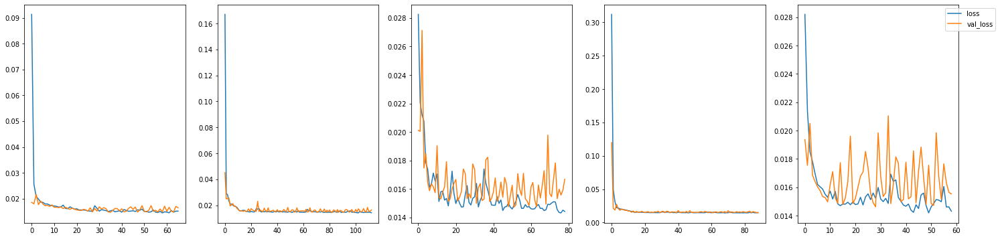

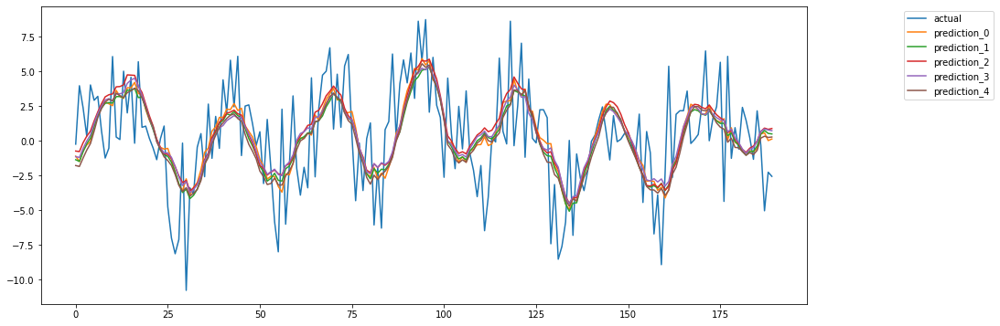

Model: "GRU_20_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru_16 (GRU)                (None, 20)                1680      
                                                                 
 dense_396 (Dense)           (None, 5)                 105       
                                                                 
 dense_397 (Dense)           (None, 1)                 6         
                                                                 
Total params: 1,791
Trainable params: 1,791
Non-trainable params: 0
_________________________________________________________________
errors: [3.169291071135059, 3.1909721580000787, 3.1227414481089073, 3.1781757217632034, 3.204295876253889]
error avg: 3.1730952550522273
error std: 0.02781672609542182


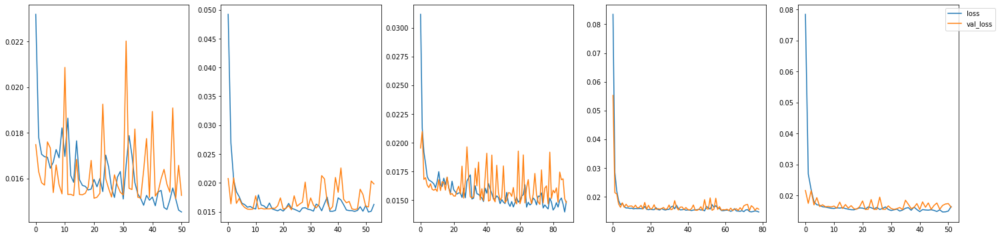

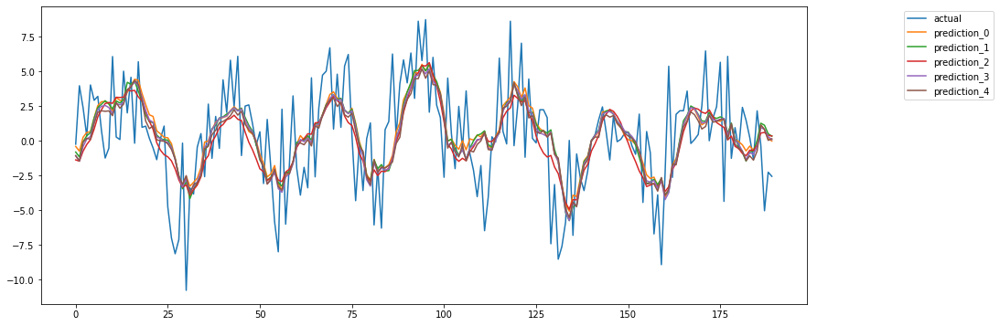

Model: "CNN_2D_20_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_20 (Conv2D)          (None, 20, 6, 64)         1024      
                                                                 
 flatten_40 (Flatten)        (None, 7680)              0         
                                                                 
 dense_398 (Dense)           (None, 5)                 38405     
                                                                 
 dense_399 (Dense)           (None, 1)                 6         
                                                                 
Total params: 39,435
Trainable params: 39,435
Non-trainable params: 0
_________________________________________________________________
errors: [3.1922997553018813, 3.260583506855741, 3.235585279858465, 3.166347839995277, 3.16366705057206]
error avg: 3.2036966865166847
error std: 0.03841924217123316


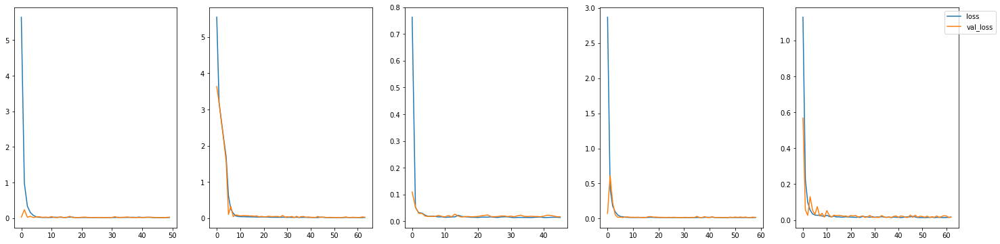

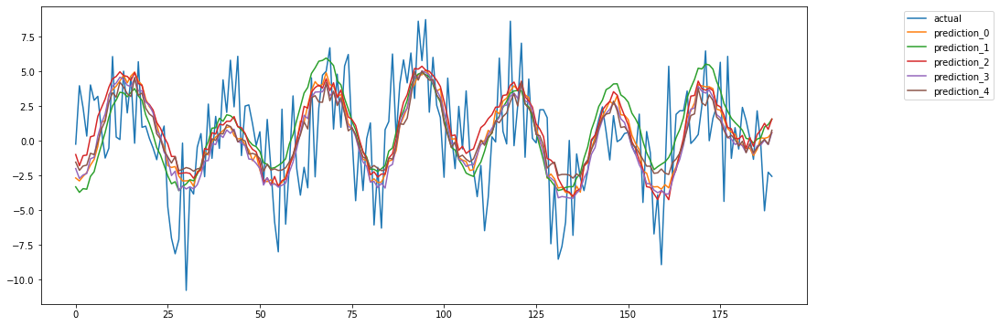

Model: "Dropout_CNN_2D_20_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_21 (Conv2D)          (None, 20, 6, 64)         1024      
                                                                 
 flatten_41 (Flatten)        (None, 7680)              0         
                                                                 
 dropout_41 (Dropout)        (None, 7680)              0         
                                                                 
 dense_400 (Dense)           (None, 5)                 38405     
                                                                 
 dense_401 (Dense)           (None, 1)                 6         
                                                                 
Total params: 39,435
Trainable params: 39,435
Non-trainable params: 0
_________________________________________________________________
errors: [3.70119295291024, 4.13698465745

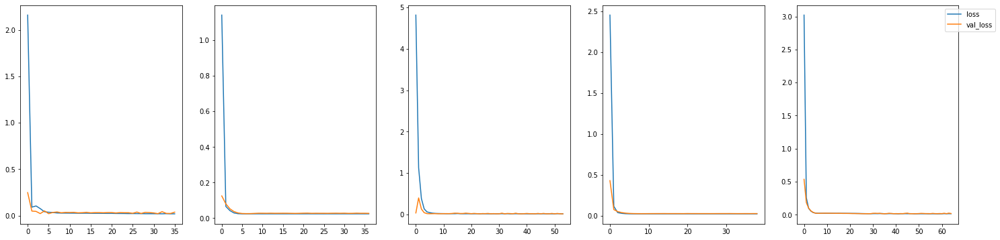

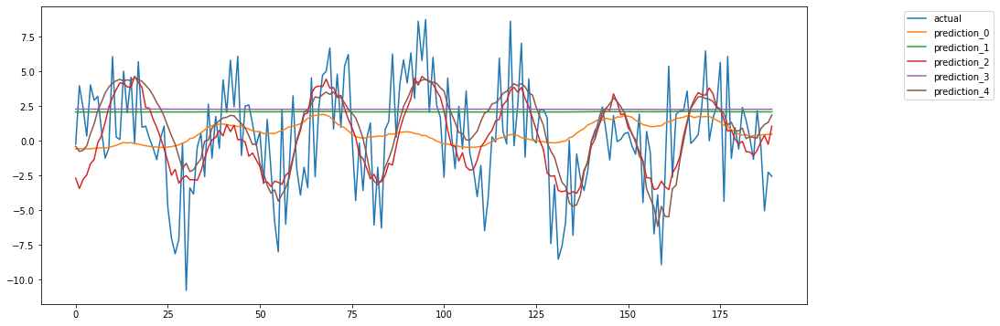

Model: "Deep_CNN_2D_20_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_22 (Conv2D)          (None, 20, 6, 64)         3264      
                                                                 
 max_pooling2d_5 (MaxPooling  (None, 10, 3, 64)        0         
 2D)                                                             
                                                                 
 conv2d_23 (Conv2D)          (None, 6, 1, 64)          61504     
                                                                 
 flatten_42 (Flatten)        (None, 384)               0         
                                                                 
 dropout_42 (Dropout)        (None, 384)               0         
                                                                 
 dense_402 (Dense)           (None, 5)                 1925      
                                               

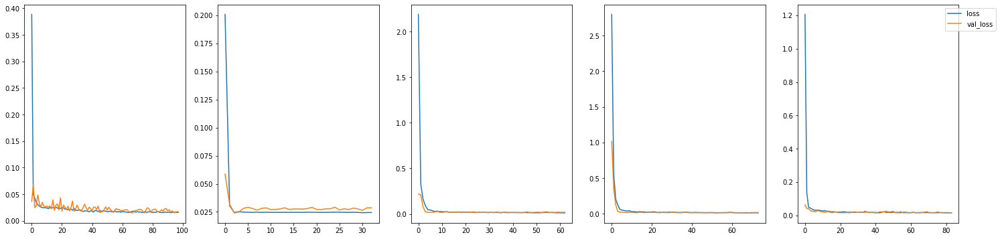

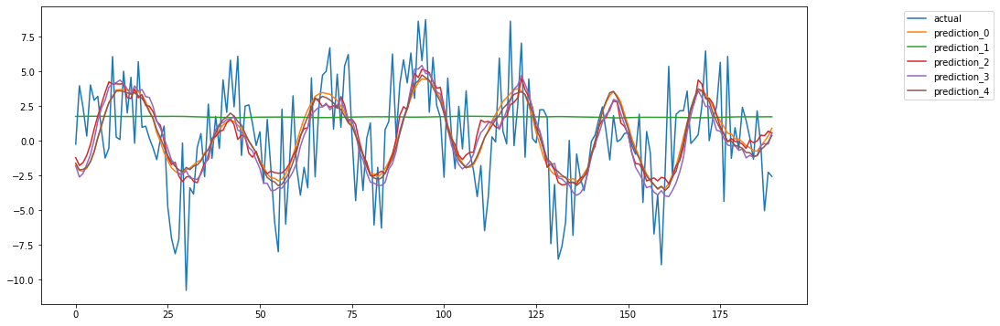

,avg,std
Simple_MLP_20_lags,3.2415629045344367,0.04361661396655481
Deep_MLP_20_lags,3.2091671509212008,0.03923541886608539
Deep_MLP_Dropout_20_lags,3.187255695835142,0.04054369083682372
RNN_20_lags,3.310348306664339,0.09925895362504328
RNN_RNN_20_lags,3.308563252311182,0.04349792247610761
LSTM_20_lags,3.11849984359844,0.008629554762072878
GRU_20_lags,3.1730952550522273,0.02781672609542182
CNN_2D_20_lags,3.2036966865166847,0.03841924217123316
Dropout_CNN_2D_20_lags,3.7237201280710712,0.40720455483154866
Deep_CNN_2D_20_lags,3.353603033184945,0.3251859648565673


In [48]:
complex_series_noise3_multivariate, X_train, y_train, X_test, y_test, lagged_series_df = new_series_multivariate(complex_series_noise3, scaler, lags)
complex_series_noise3_multivariate_result_20_lags_all_models = evaluate_all_models_multivariate(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test, scaler=scaler, verbose=False, plot=True, print_summary=True)
complex_series_noise3_multivariate_result_20_lags_all_models

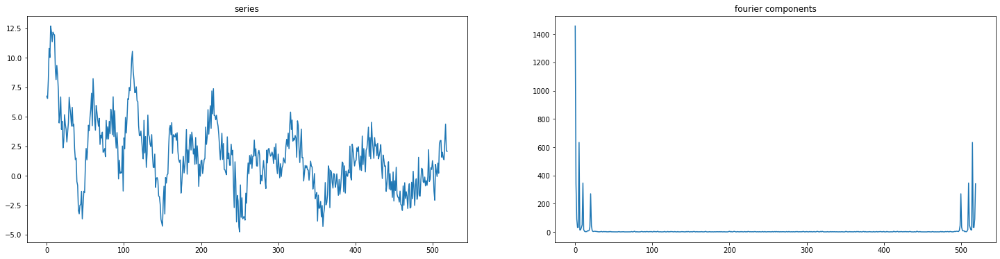

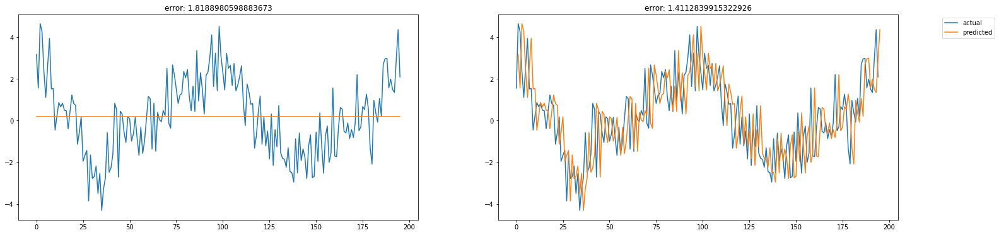

Model: "Simple_MLP_20_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_404 (Dense)           (None, 20)                2420      
                                                                 
 dense_405 (Dense)           (None, 1)                 21        
                                                                 
Total params: 2,441
Trainable params: 2,441
Non-trainable params: 0
_________________________________________________________________
errors: [1.1592458667423886, 1.1868798934572267, 1.172904211307584, 1.2003742159240482, 1.196154016015814]
error avg: 1.1831116406894122
error std: 0.01520570003310458


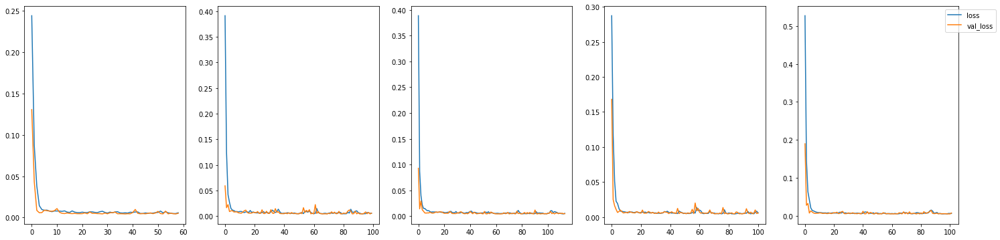

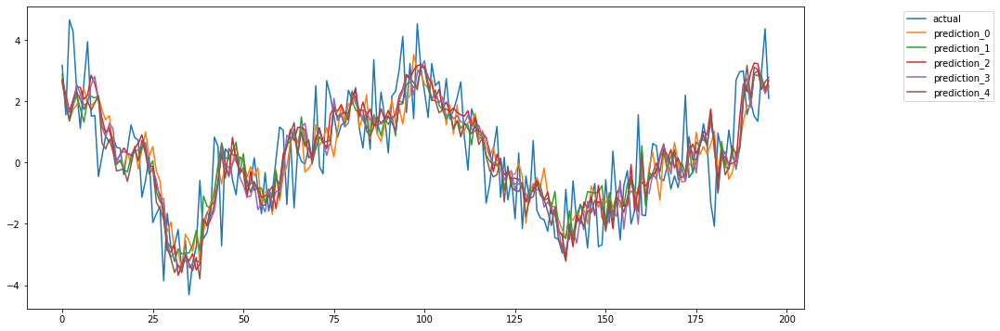

Model: "Deep_MLP_20_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_406 (Dense)           (None, 20)                2420      
                                                                 
 dense_407 (Dense)           (None, 100)               2100      
                                                                 
 dense_408 (Dense)           (None, 10)                1010      
                                                                 
 dense_409 (Dense)           (None, 1)                 11        
                                                                 
Total params: 5,541
Trainable params: 5,541
Non-trainable params: 0
_________________________________________________________________
errors: [1.1537662773715067, 1.1801590914972335, 1.1492604266113016, 1.1337166619898602, 1.1443686206298593]
error avg: 1.1522542156199522
error std: 0.01546450583776684


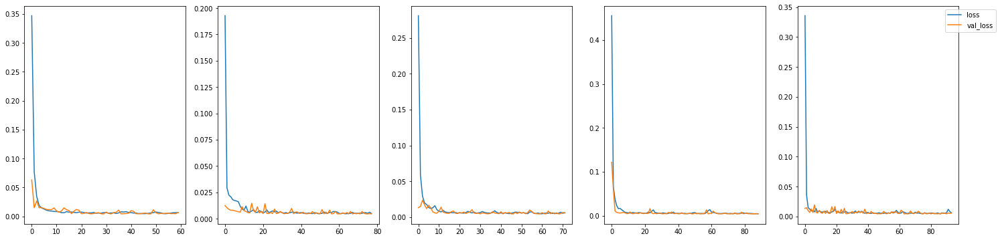

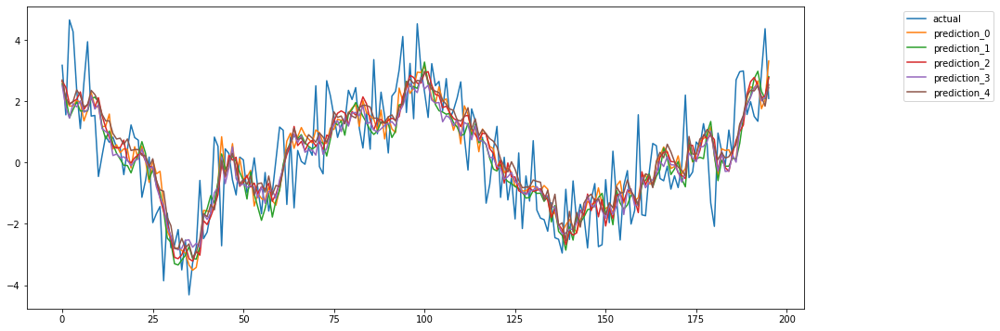

Model: "Deep_MLP_Dropout_20_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_410 (Dense)           (None, 20)                2420      
                                                                 
 dense_411 (Dense)           (None, 100)               2100      
                                                                 
 dropout_43 (Dropout)        (None, 100)               0         
                                                                 
 dense_412 (Dense)           (None, 10)                1010      
                                                                 
 dense_413 (Dense)           (None, 1)                 11        
                                                                 
Total params: 5,541
Trainable params: 5,541
Non-trainable params: 0
_________________________________________________________________
errors: [1.1498214889382925, 1.172718003

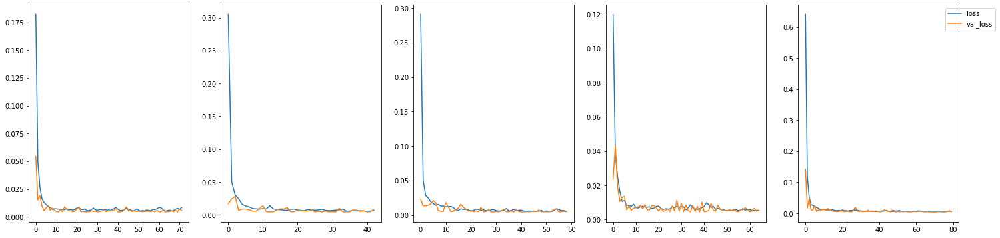

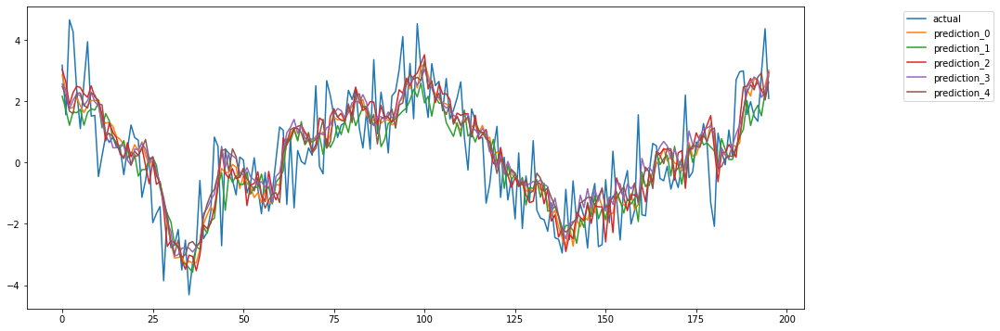

Model: "RNN_20_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 simple_rnn_51 (SimpleRNN)   (None, 20)                540       
                                                                 
 dense_414 (Dense)           (None, 5)                 105       
                                                                 
 dense_415 (Dense)           (None, 1)                 6         
                                                                 
Total params: 651
Trainable params: 651
Non-trainable params: 0
_________________________________________________________________
errors: [1.1531878831730877, 1.1984885366506077, 1.1795113447771564, 1.2129589539282233, 1.182798696869307]
error avg: 1.1853890830796765
error std: 0.020049282511643205


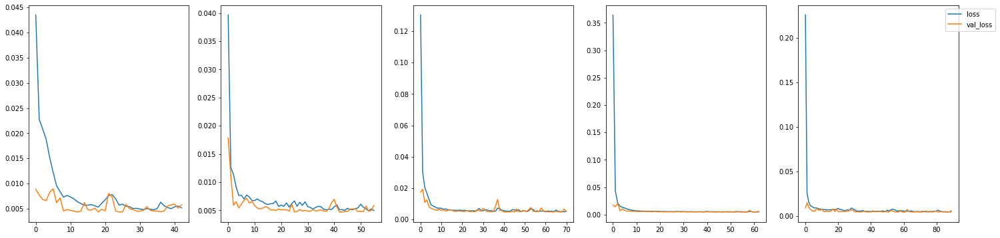

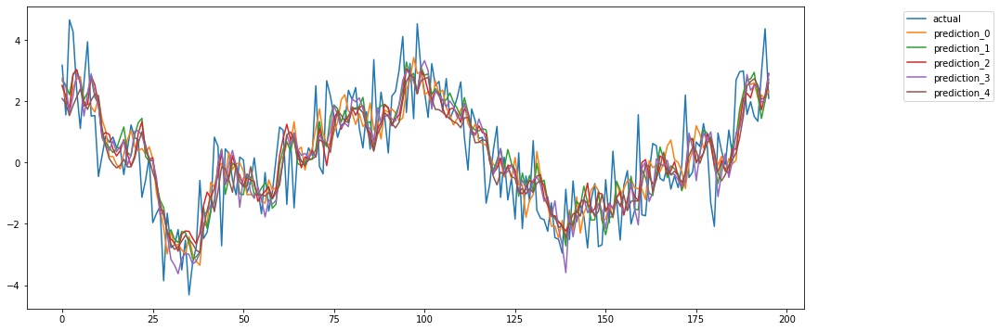

Model: "RNN_RNN_20_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 simple_rnn_52 (SimpleRNN)   (None, 20, 20)            540       
                                                                 
 simple_rnn_53 (SimpleRNN)   (None, 10)                310       
                                                                 
 dense_416 (Dense)           (None, 5)                 55        
                                                                 
 dense_417 (Dense)           (None, 1)                 6         
                                                                 
Total params: 911
Trainable params: 911
Non-trainable params: 0
_________________________________________________________________
errors: [1.2163321175711785, 1.219361479215085, 1.222328031259097, 1.2342012687183492, 1.2023411337381709]
error avg: 1.218912806100376
error std: 0.010265305040131959


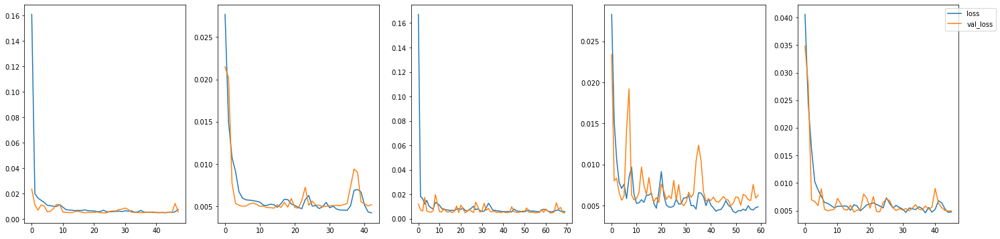

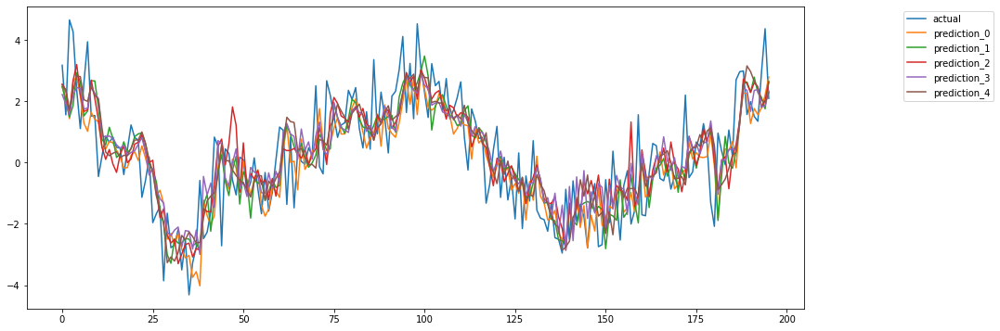

Model: "LSTM_20_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_17 (LSTM)              (None, 20)                2160      
                                                                 
 dense_418 (Dense)           (None, 5)                 105       
                                                                 
 dense_419 (Dense)           (None, 1)                 6         
                                                                 
Total params: 2,271
Trainable params: 2,271
Non-trainable params: 0
_________________________________________________________________
errors: [1.1478490370958758, 1.1435950380770306, 1.157844499079423, 1.1683453961454355, 1.1511773805578618]
error avg: 1.1537622701911254
error std: 0.00865277694399336


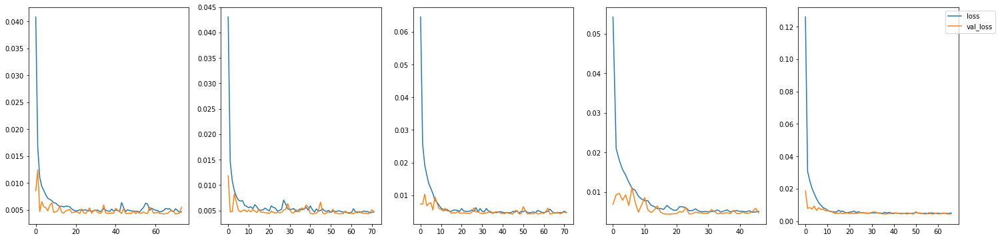

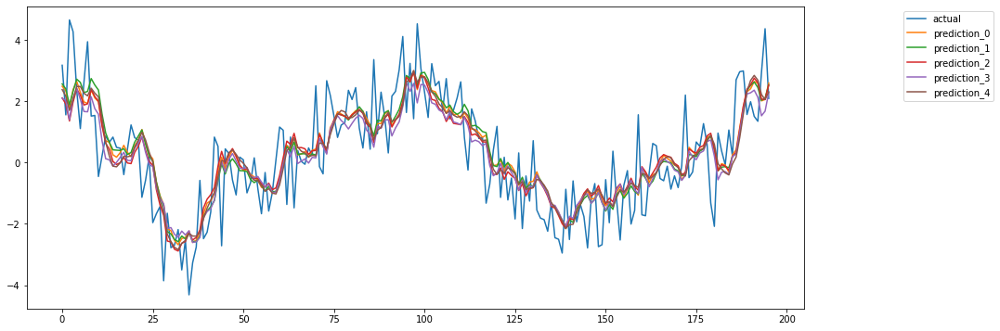

Model: "GRU_20_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru_17 (GRU)                (None, 20)                1680      
                                                                 
 dense_420 (Dense)           (None, 5)                 105       
                                                                 
 dense_421 (Dense)           (None, 1)                 6         
                                                                 
Total params: 1,791
Trainable params: 1,791
Non-trainable params: 0
_________________________________________________________________
errors: [1.179436991674345, 1.1873584187655033, 1.1824124618753327, 1.1729232981503532, 1.179168218833578]
error avg: 1.1802598778598223
error std: 0.0047056809044107644


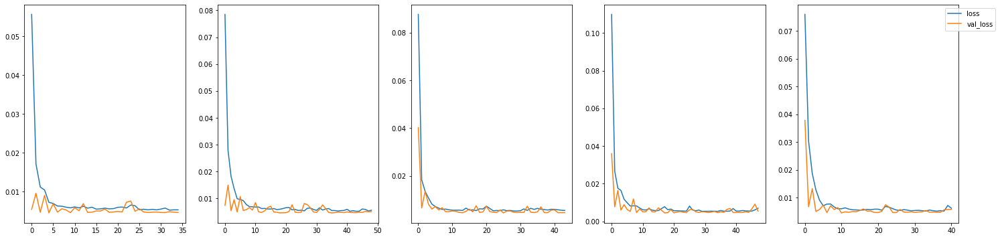

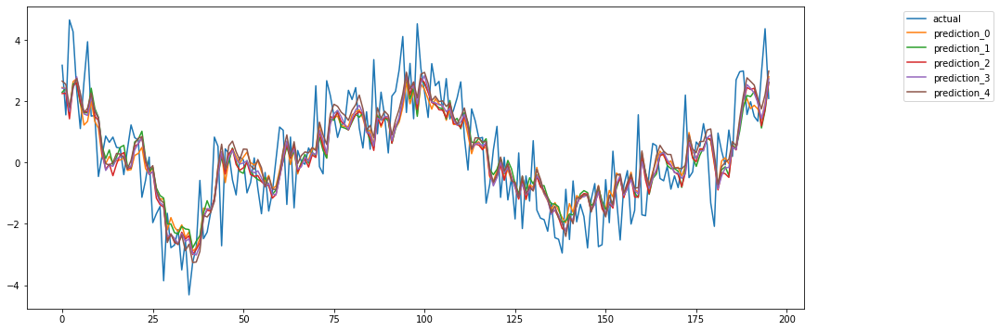

Model: "CNN_2D_20_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_24 (Conv2D)          (None, 20, 6, 64)         1024      
                                                                 
 flatten_43 (Flatten)        (None, 7680)              0         
                                                                 
 dense_422 (Dense)           (None, 5)                 38405     
                                                                 
 dense_423 (Dense)           (None, 1)                 6         
                                                                 
Total params: 39,435
Trainable params: 39,435
Non-trainable params: 0
_________________________________________________________________
errors: [2.050390110529997, 1.1949023736695523, 1.2014133852763844, 1.2430293740457776, 1.17271050430751]
error avg: 1.3724891495658442
error std: 0.3397131241372772


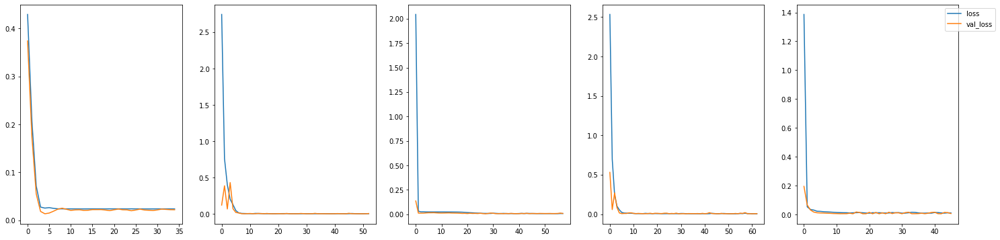

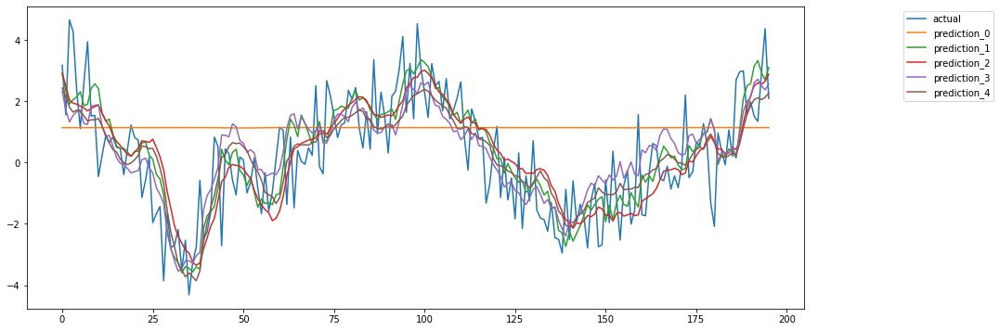

Model: "Dropout_CNN_2D_20_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_25 (Conv2D)          (None, 20, 6, 64)         1024      
                                                                 
 flatten_44 (Flatten)        (None, 7680)              0         
                                                                 
 dropout_44 (Dropout)        (None, 7680)              0         
                                                                 
 dense_424 (Dense)           (None, 5)                 38405     
                                                                 
 dense_425 (Dense)           (None, 1)                 6         
                                                                 
Total params: 39,435
Trainable params: 39,435
Non-trainable params: 0
_________________________________________________________________
errors: [1.1678029639785685, 1.178399558

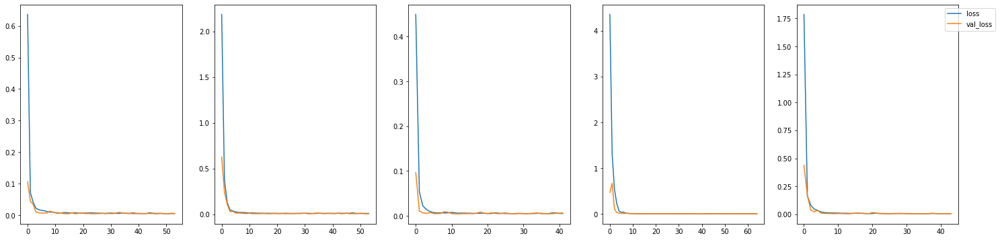

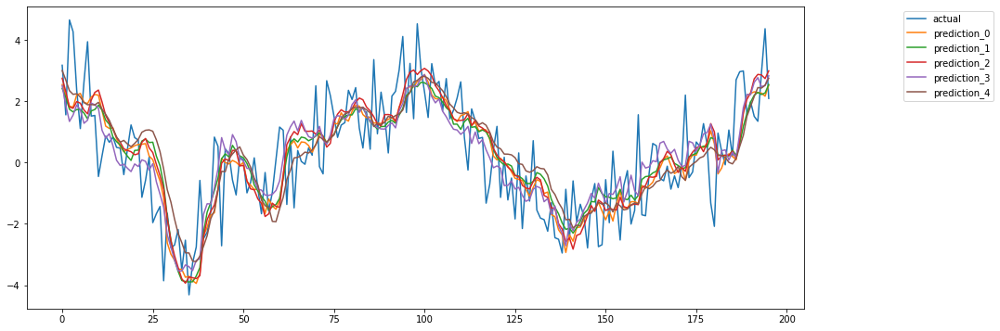

Model: "Deep_CNN_2D_20_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_26 (Conv2D)          (None, 20, 6, 64)         3264      
                                                                 
 max_pooling2d_6 (MaxPooling  (None, 10, 3, 64)        0         
 2D)                                                             
                                                                 
 conv2d_27 (Conv2D)          (None, 6, 1, 64)          61504     
                                                                 
 flatten_45 (Flatten)        (None, 384)               0         
                                                                 
 dropout_45 (Dropout)        (None, 384)               0         
                                                                 
 dense_426 (Dense)           (None, 5)                 1925      
                                               

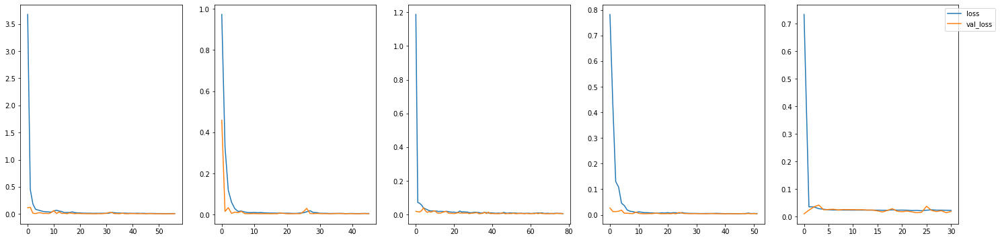

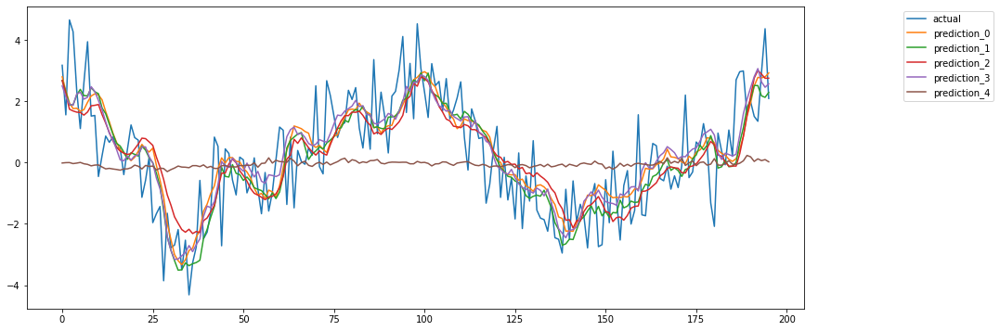

,avg,std
Simple_MLP_20_lags,1.1831116406894122,0.01520570003310458
Deep_MLP_20_lags,1.1522542156199522,0.01546450583776684
Deep_MLP_Dropout_20_lags,1.1658541311087331,0.008442329961329391
RNN_20_lags,1.1853890830796765,0.020049282511643205
RNN_RNN_20_lags,1.218912806100376,0.010265305040131959
LSTM_20_lags,1.1537622701911254,0.00865277694399336
GRU_20_lags,1.1802598778598223,0.0047056809044107644
CNN_2D_20_lags,1.3724891495658442,0.3397131241372772
Dropout_CNN_2D_20_lags,1.188177607459514,0.017812635387116322
Deep_CNN_2D_20_lags,1.2822176789692352,0.26210502007641995


In [49]:
complex_fasing_series_noise3, X_train, y_train, X_test, y_test, lagged_series_df = new_series_multivariate(complex_fasing_series_noise3, scaler, lags)
complex_fasing_series_noise3_multivariate_result_20_lags_all_models = evaluate_all_models_multivariate(X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test, scaler=scaler, verbose=False, plot=True, print_summary=True)
complex_fasing_series_noise3_multivariate_result_20_lags_all_models

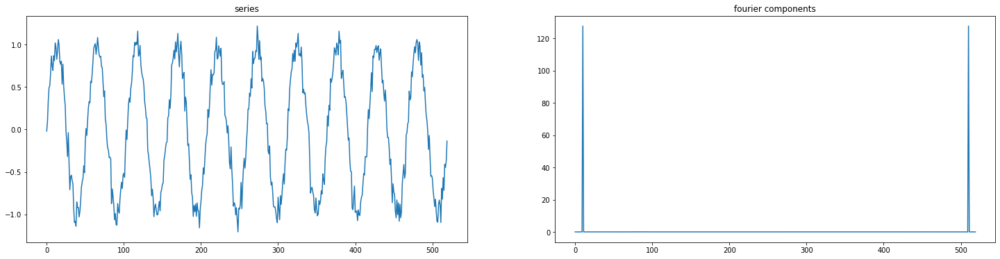

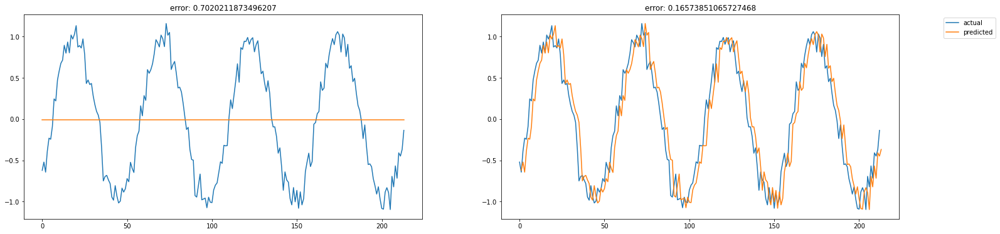

Model: "CNN_10_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_22 (Conv1D)          (None, 6, 64)             384       
                                                                 
 flatten_46 (Flatten)        (None, 384)               0         
                                                                 
 dense_428 (Dense)           (None, 5)                 1925      
                                                                 
 dense_429 (Dense)           (None, 1)                 6         
                                                                 
Total params: 2,315
Trainable params: 2,315
Non-trainable params: 0
_________________________________________________________________
errors: [0.7023846899359778, 0.12067518244640288, 0.11956095425537534, 0.11898259436113236, 0.12132714648432846]
error avg: 0.23658611349664338
error std: 0.23290073543683398


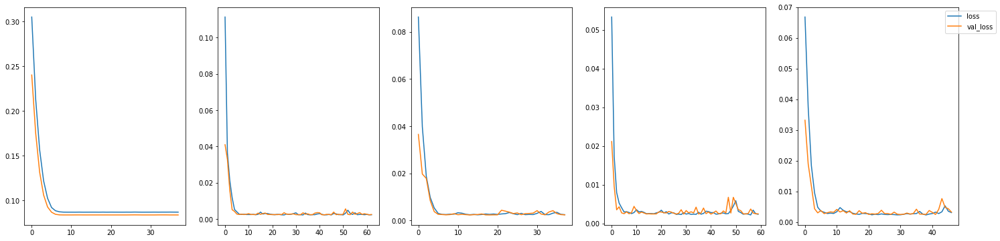

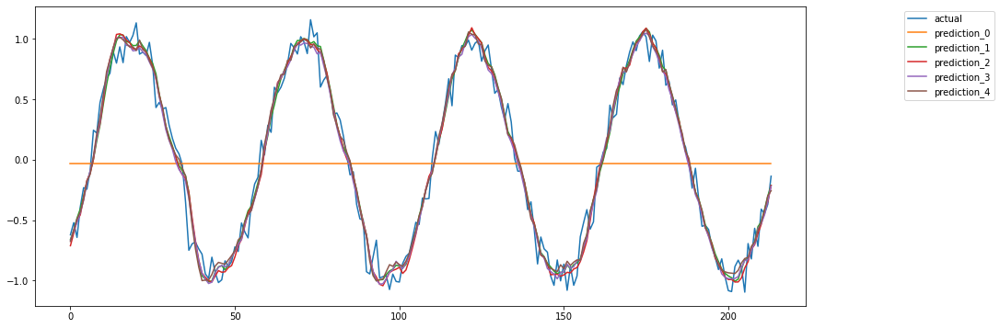

Model: "CNN_10_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_23 (Conv1D)          (None, 6, 64)             384       
                                                                 
 flatten_47 (Flatten)        (None, 384)               0         
                                                                 
 dense_430 (Dense)           (None, 5)                 1925      
                                                                 
 dense_431 (Dense)           (None, 1)                 6         
                                                                 
Total params: 2,315
Trainable params: 2,315
Non-trainable params: 0
_________________________________________________________________
errors: [0.12099634501598278, 0.11881288862999698, 0.12157349837008924, 0.12431250355098851, 0.12169031603520329]
error avg: 0.12147711032045214
error std: 0.001756326541310593


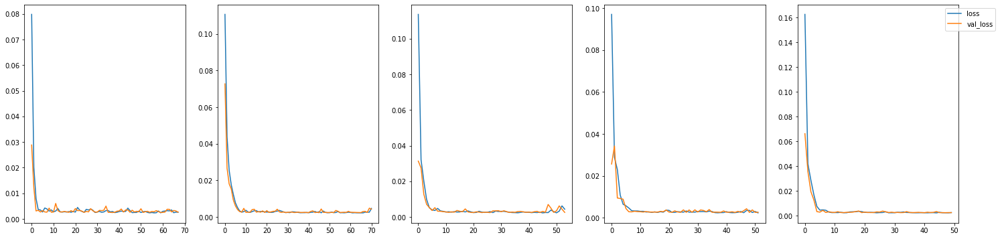

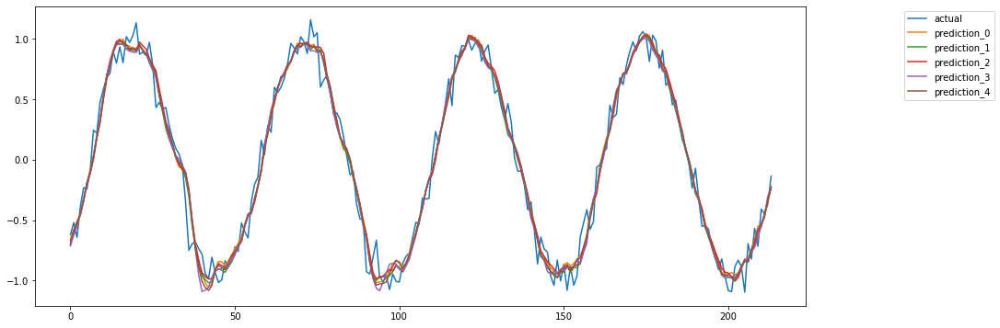

Model: "CNN_10_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_24 (Conv1D)          (None, 6, 64)             384       
                                                                 
 flatten_48 (Flatten)        (None, 384)               0         
                                                                 
 dense_432 (Dense)           (None, 5)                 1925      
                                                                 
 dense_433 (Dense)           (None, 1)                 6         
                                                                 
Total params: 2,315
Trainable params: 2,315
Non-trainable params: 0
_________________________________________________________________
errors: [0.12011893023790797, 0.11883534534119286, 0.12349956112202756, 0.12270165580393587, 0.12108695848913129]
error avg: 0.12124849019883913
error std: 0.0016914063308161745


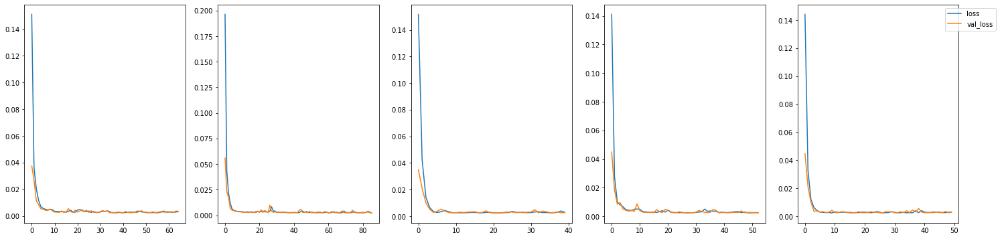

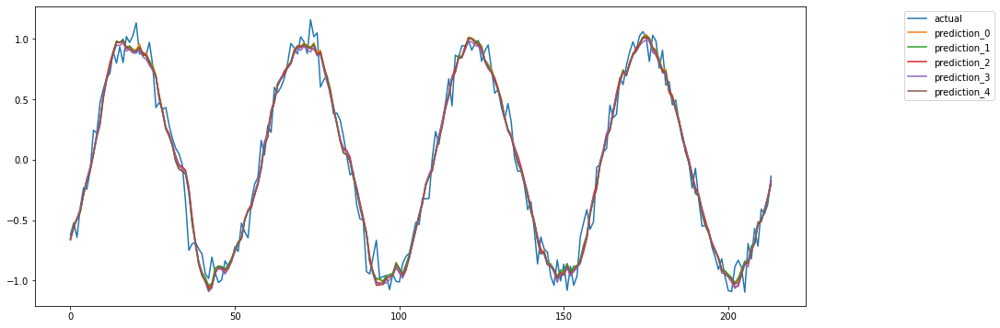

Model: "GRU_10_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru_18 (GRU)                (None, 10)                390       
                                                                 
 dense_434 (Dense)           (None, 5)                 55        
                                                                 
 dense_435 (Dense)           (None, 1)                 6         
                                                                 
Total params: 451
Trainable params: 451
Non-trainable params: 0
_________________________________________________________________
errors: [0.12282720008609978, 0.1250942615464445, 0.12137345334510054, 0.12066780255356475, 0.12623089791331504]
error avg: 0.12323872308890493
error std: 0.002128583939865457


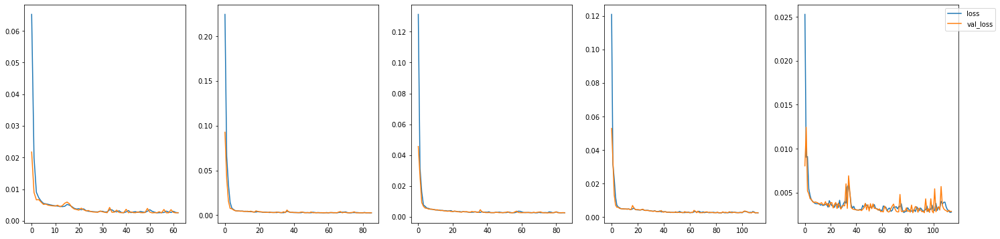

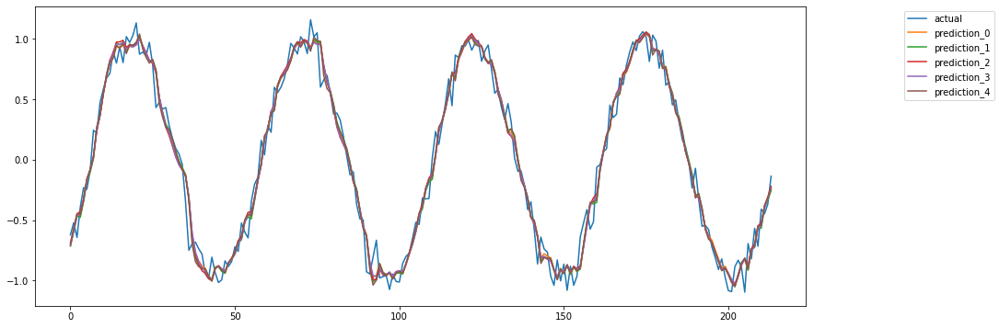

Model: "GRU_10_lags"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru_19 (GRU)                (None, 10)                390       
                                                                 
 dense_436 (Dense)           (None, 5)                 55        
                                                                 
 dense_437 (Dense)           (None, 1)                 6         
                                                                 
Total params: 451
Trainable params: 451
Non-trainable params: 0
_________________________________________________________________
errors: [0.12451382657988867, 0.12614859235569484, 0.13278315557305834, 0.1289286316593213, 0.12270650928507408]
error avg: 0.12701614309060744
error std: 0.003535625014999887


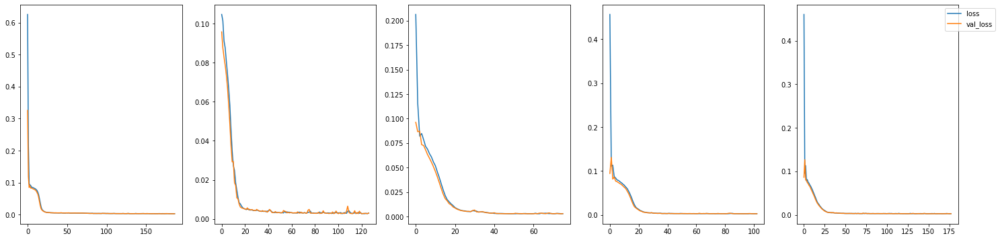

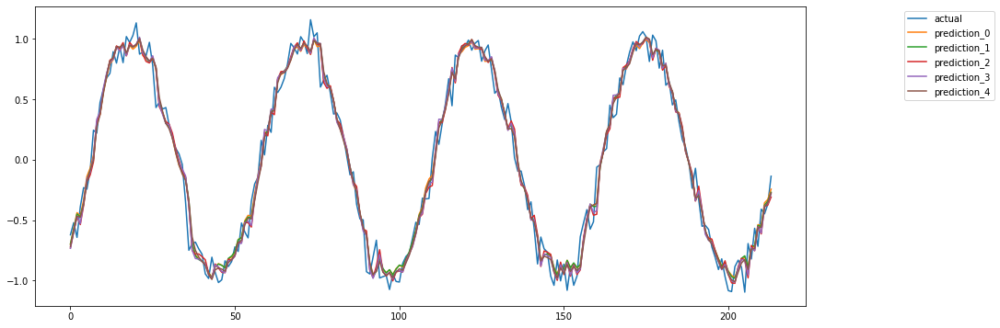

{'GRU_10_lags': ([0.12451382657988867,
   0.12614859235569484,
   0.13278315557305834,
   0.1289286316593213,
   0.12270650928507408],
  0.12701614309060744,
  0.003535625014999887)}

In [50]:
lags=10
noisy_sin_series, X_train, y_train, X_test, y_test, lagged_series_df = new_series(noisy_sin_series, scaler, lags)
evaluate_model(
    5,
    [
        layers.Conv1D(64, kernel_size=math.ceil(10.0 / 2.), activation=activations.relu),
        layers.Flatten(),
        layers.Dense(5, activation=activations.relu),
        layers.Dense(1, activation=activations.linear)
    ], 
    X_train.reshape(X_train.shape[0], X_train.shape[1], 1), 
    y_train, 
    X_test.reshape(X_test.shape[0], X_test.shape[1], 1), 
    y_test,
    epochs=200,
    batch_size=32,
    name=f'CNN_{lags}_lags',
    scaler=scaler,
    early_stop=True,
    learning_rate=0.01,
    verbose=False,
    print_plot=True,
    print_summary=True
)

evaluate_model(
    5,
    [
        layers.Conv1D(64, kernel_size=math.ceil(10.0 / 2.), activation=activations.relu),
        layers.Flatten(),
        layers.Dense(5, activation=activations.elu),
        layers.Dense(1, activation=activations.linear)
    ], 
    X_train.reshape(X_train.shape[0], X_train.shape[1], 1), 
    y_train, 
    X_test.reshape(X_test.shape[0], X_test.shape[1], 1), 
    y_test,
    epochs=200,
    batch_size=32,
    name=f'CNN_{lags}_lags',
    scaler=scaler,
    early_stop=True,
    learning_rate=0.01,
    verbose=False,
    print_plot=True,
    print_summary=True
)

evaluate_model(
    5,
    [
        layers.Conv1D(64, kernel_size=math.ceil(10.0 / 2.), activation=activations.elu),
        layers.Flatten(),
        layers.Dense(5, activation=activations.elu),
        layers.Dense(1, activation=activations.linear)
    ], 
    X_train.reshape(X_train.shape[0], X_train.shape[1], 1), 
    y_train, 
    X_test.reshape(X_test.shape[0], X_test.shape[1], 1), 
    y_test,
    epochs=200,
    batch_size=32,
    name=f'CNN_{lags}_lags',
    scaler=scaler,
    early_stop=True,
    learning_rate=0.01,
    verbose=False,
    print_plot=True,
    print_summary=True
)

evaluate_model(
    5,
    [
        layers.GRU(10, activation=activations.elu),
        layers.Dense(5, activation=activations.elu),
        layers.Dense(1, activation=activations.linear)
    ], 
    X_train.reshape(X_train.shape[0], X_train.shape[1], 1), 
    y_train, 
    X_test.reshape(X_test.shape[0], X_test.shape[1], 1), 
    y_test,
    epochs=200,
    batch_size=32,
    name=f'GRU_{lags}_lags',
    scaler=scaler,
    early_stop=True,
    learning_rate=0.01,
    verbose=False,
    print_plot=True,
    print_summary=True
)

evaluate_model(
    5,
    [
        layers.GRU(10, activation=activations.sigmoid),
        layers.Dense(5, activation=activations.sigmoid),
        layers.Dense(1, activation=activations.linear)
    ], 
    X_train.reshape(X_train.shape[0], X_train.shape[1], 1), 
    y_train, 
    X_test.reshape(X_test.shape[0], X_test.shape[1], 1), 
    y_test,
    epochs=200,
    batch_size=32,
    name=f'GRU_{lags}_lags',
    scaler=scaler,
    early_stop=True,
    learning_rate=0.01,
    verbose=False,
    print_plot=True,
    print_summary=True
)